In [3]:
import vice

/astro/dboyea/.local/lib/python3.11/site-packages/vice-1.4.0.dev0-py3.11-linux-x86_64.egg/vice/__init__.py:141: UserWarning: Using un-released version of VICE
  warnings.warn("Using un-released version of VICE", UserWarning)


In [4]:
import numpy as np

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import surp

import surp.gce_math as gcem
import arya

In [6]:
%load_ext autoreload
%autoreload 2

In [7]:
import mc_plot_utils

In [8]:
from scipy.stats import binned_statistic

In [9]:
def plot_all(filename, props, test=False, burn=0, skip=100, directory="mcmc_models_2d"):
    y0 = props["y0"],
    y_a = props["y_a"]
    zeta_a = props["zeta_a"]

    modeldir = f"../models/{directory}/{filename}/"

    if test:
        result = mc_plot_utils.MCMCResult.from_test_file(modeldir, burn=burn)
    else:
        result = mc_plot_utils.MCMCResult.from_file(modeldir, y0=y0, burn=burn, y_a=y_a, zeta_a=zeta_a)

    result.print_stats()
    mc_plot_utils.plot_yields(result)
    plt.savefig(modeldir  + "/yields.pdf")
    plt.show()
    
    fig = plt.figure(figsize=(6, 6))
    result.plot_corner(fig=fig)
    plt.savefig(modeldir  + "/corner.pdf")
    plt.show()

    mc_plot_utils.plot_samples_caah(result, skip=skip)
    mc_plot_utils.plot_obs_caah(result, color=arya.COLORS[1])
    plt.ylim(-0.05, 0.15)
    plt.savefig(modeldir + "/caah_samples.pdf")

    plt.show()

    mc_plot_utils.plot_samples_caafe(result, skip=skip)
    mc_plot_utils.plot_obs_caafe(result, color=arya.COLORS[1])
    plt.ylim(-0.05, 0.15)

    plt.savefig(modeldir + "/caafe_samples.pdf")

    plt.show()

    if y0 is not None:
        mc_plot_utils.plot_fagb_hist(result)
        plt.savefig(modeldir + "/fagb_hist.pdf")

        
    return

In [10]:
vice.yields.agb.settings["c"] = surp.agb_interpolator.interpolator("c", mass_factor=0.5)
y0 = surp.yields.calc_y(kind="agb")
y0

0.0002832489228255587

In [11]:
for study in surp.AGB_MODELS:
    vice.yields.agb.settings["c"] = surp.agb_interpolator.interpolator("c", study=study)
    y0 = surp.yields.calc_y(Z=surp.Z_SUN, kind="agb")
    print(f"{study:8s}\t{y0/1e-4:6.3f}")


cristallo11	 3.113
ventura13	-0.009
karakas16	 2.956
battino19	 9.248


In [12]:
df = pd.read_csv("yield_fits.tsv", sep=r"\s+", comment="#")
df

,model,y0,zeta0,zeta0_err,zeta1,zeta1_err
0,fruity,3.110,3.7,0.3,-3.5,0.3
1,aton,-0.009,1.0,1.9,-10.0,3.0
2,monash,2.960,2.3,0.5,-11.0,1.0
3,nugrid,9.250,8.1,1.9,-4.6,1.7
4,fruity_mf0.5,2.830,3.3,0.2,-1.8,0.2
5,fruity_mf0.7,3.600,4.2,0.3,-3.1,0.3
6,fruity_mf1.5,3.110,3.4,0.2,-3.0,0.2


In [13]:
yagb_props = {}

for _, row in df.iterrows():
    yagb_props[row.model] = {
        "y0": row.y0 * 1e-4,
        "y_a": row.zeta0 * 1e-4,
        "zeta_a": row.zeta1 * 1e-4,
    }

yagb_props["analytic"] = {
    "y0": 1e-3,
    "y_a": 1e-3,
    "zeta_a": 1e-3
}

yagb_props

{'fruity': {'y0': 0.000311, 'y_a': 0.00037000000000000005, 'zeta_a': -0.00035},
 'aton': {'y0': -9e-07, 'y_a': 0.0001, 'zeta_a': -0.001},
 'monash': {'y0': 0.000296, 'y_a': 0.00022999999999999998, 'zeta_a': -0.0011},
 'nugrid': {'y0': 0.000925, 'y_a': 0.00081, 'zeta_a': -0.00045999999999999996},
 'fruity_mf0.5': {'y0': 0.000283, 'y_a': 0.00033, 'zeta_a': -0.00018},
 'fruity_mf0.7': {'y0': 0.00036, 'y_a': 0.00042, 'zeta_a': -0.00031},
 'fruity_mf1.5': {'y0': 0.000311,
  'y_a': 0.00034,
  'zeta_a': -0.00030000000000000003},
 'analytic': {'y0': 0.001, 'y_a': 0.001, 'zeta_a': 0.001}}

In [14]:
def make_new_params(y0_l = 0.989, slope = 0.839, alpha = 2.64, study="fruity"):

    y0 = (y0_l + slope)*1e-3
    zeta = 1e-3 * slope / surp.Z_SUN / surp.yield_models.zeta_to_slope(1)
    
    print(f"alpha_c_agb = {alpha:0.2f}" )
    print(f"y0_c_cc = {y0:0.2e}" )
    print(f"zeta_c_cc = {zeta:0.2e}", )
    
    f_agb = yagb_props[study]["y0"] * alpha / (yagb_props[study]["y0"] * alpha + y0)
    print(f"f = {f_agb:0.3f}" )


In [15]:
def make_f_agb(y0 = 0.989, f_new = 0.839, alpha = 2.64, study="fruity"):
    ya = yagb_props[study]["y0"]
    ytot = ya * alpha + y0
    
    f_agb = ya * alpha / ytot

    alpha_new = f_new * ytot / ya

    y0_new = ytot - alpha_new * ya
    f_new_new = ya * alpha_new / ytot

    print(f"y0 = {y0_new:0.3e}" )
    print(f"alpha = {alpha_new:0.3f}" )

    print(f"f = {f_new_new:0.3f}" )


# Body

## model setup

length of samples =  48000
{'alpha': {'name': 'perturbations/fruity', 'prior': 'Normal', 'prior_args': [1.0, 1.0]}, 'y0_cc': {'name': 'perturbations/constant', 'prior': 'Normal', 'prior_args': [2.0, 1.0]}, 'zeta_cc': {'name': 'perturbations/linear', 'prior': 'Normal', 'prior_args': [0.0, 2.0], 'y0': 0.001}}
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 1.434	-0.039	+0.040	-0.122	+0.121
y0_cc   	 1.623	-0.019	+0.019	-0.061	+0.059
zeta_cc 	 0.630	-0.010	+0.010	-0.030	+0.032


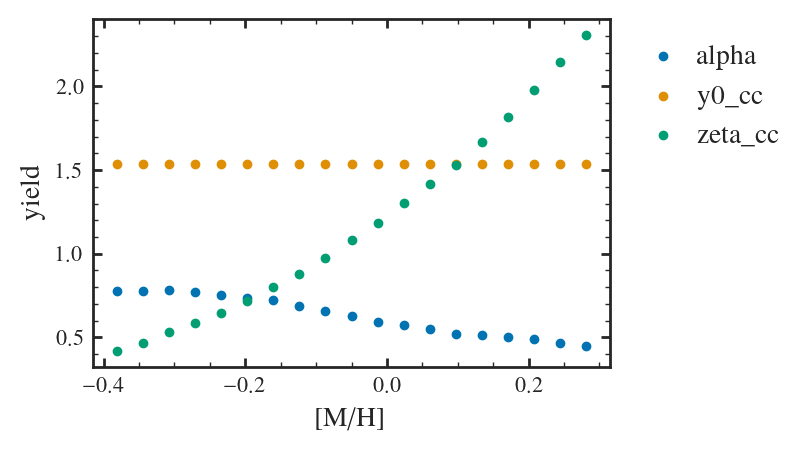

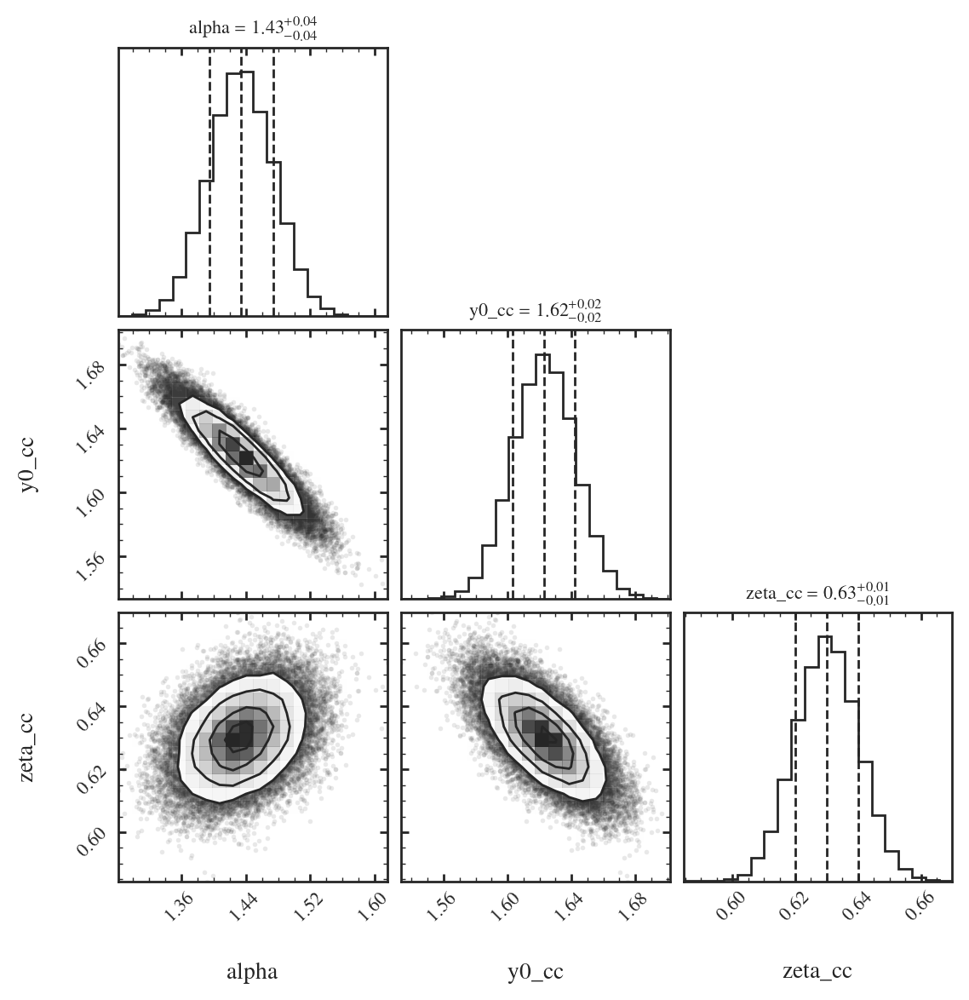

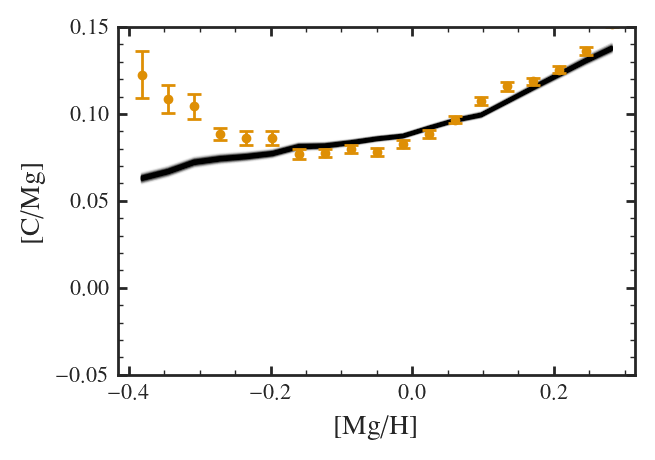

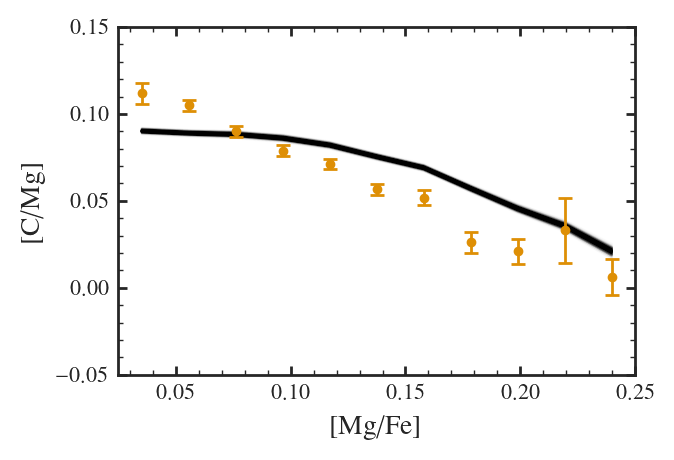

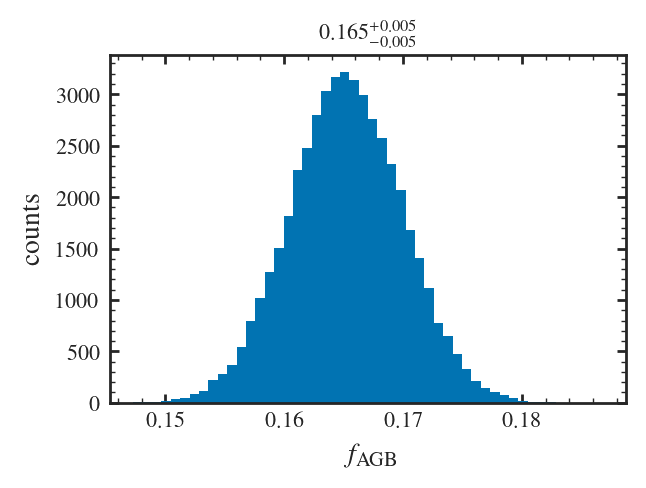

In [24]:
plot_all("fiducial", yagb_props["fruity"])

length of samples =  48000
{'alpha': {'name': 'perturbations/fruity', 'prior': 'Normal', 'prior_args': [1.0, 1.0]}, 'y0_cc': {'name': 'perturbations/constant', 'prior': 'Normal', 'prior_args': [2.0, 1.0]}, 'zeta_cc': {'name': 'perturbations/linear', 'prior': 'Normal', 'prior_args': [0.0, 2.0], 'y0': 0.001}}
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 1.619	-0.100	+0.101	-0.316	+0.323
y0_cc   	 1.649	-0.038	+0.038	-0.117	+0.120
zeta_cc 	 0.543	-0.037	+0.036	-0.118	+0.112
sigma_int	 0.021	-0.002	+0.002	-0.004	+0.006


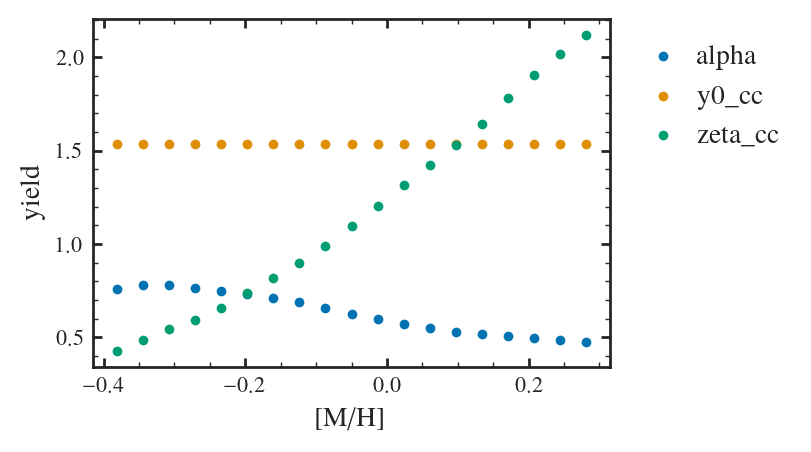

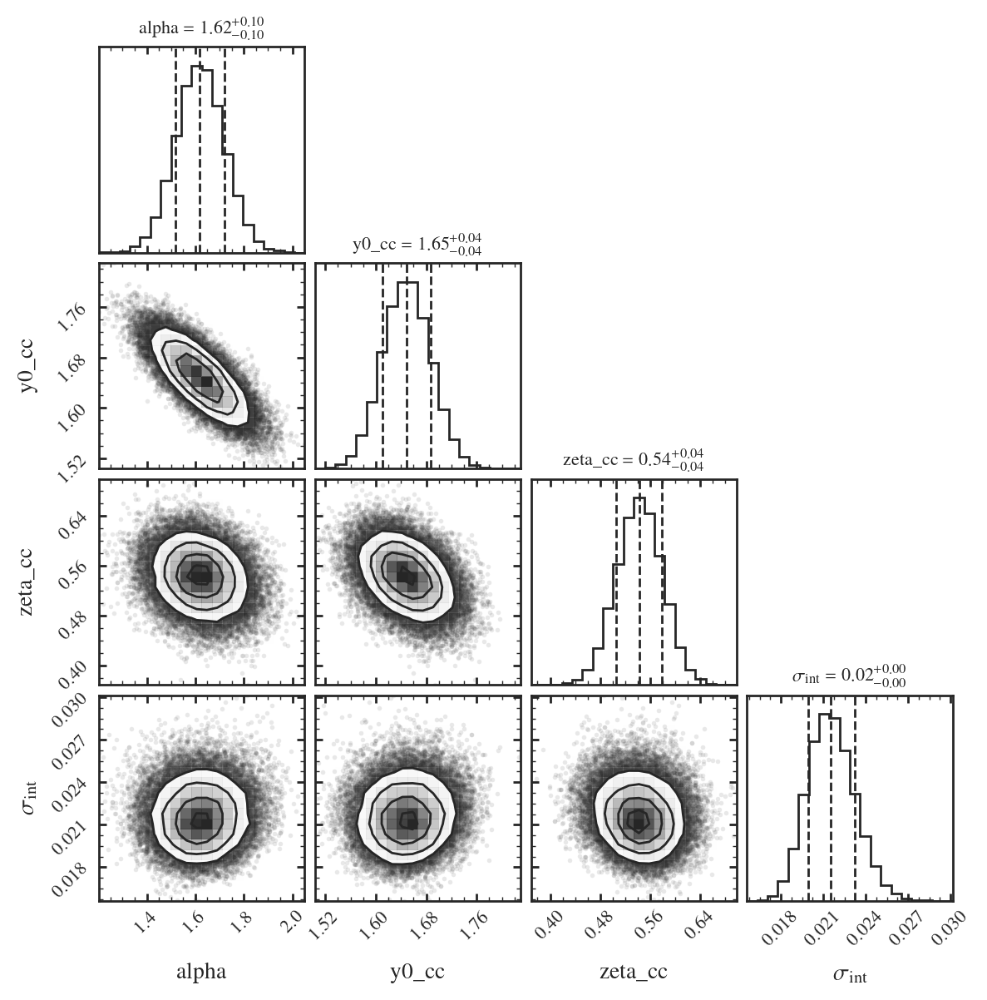

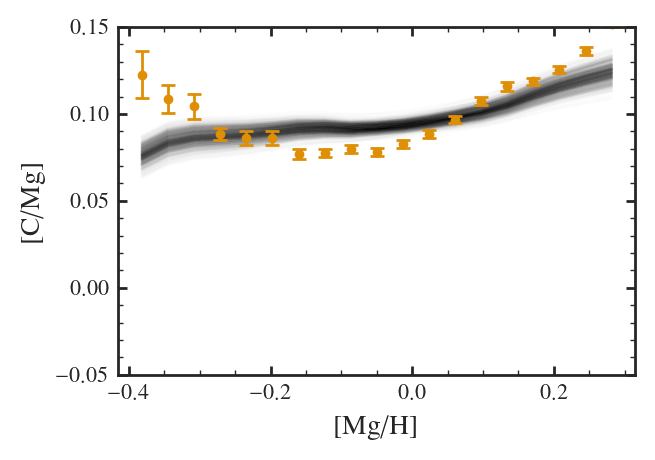

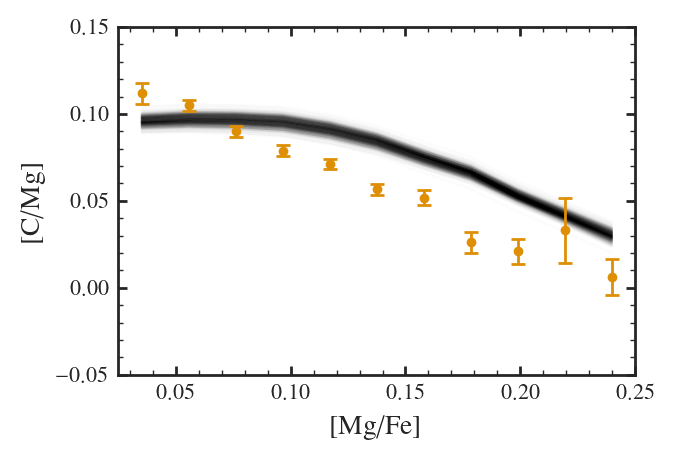

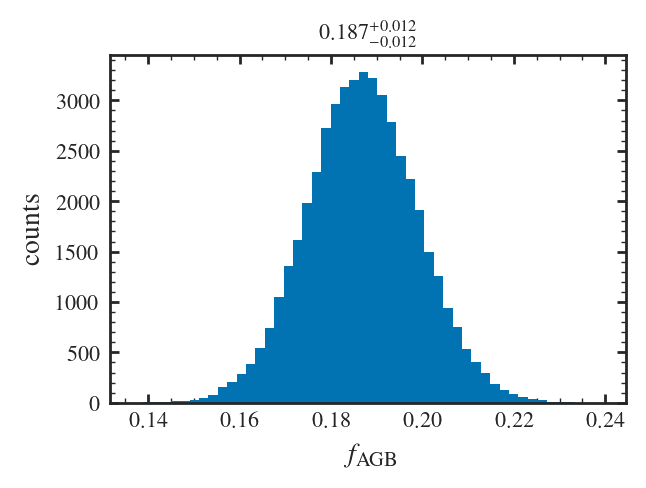

In [19]:
plot_all("fiducial_sigma", yagb_props["fruity"])

In [28]:
1.547 + 0.900

2.447

In [32]:
make_new_params(y0_l=1.55, slope=0.9, alpha=0.868)

alpha_c_agb = 0.87
y0_c_cc = 2.45e-03
zeta_c_cc = 2.07e-03
f = 0.099


length of samples =  48000
{'alpha': {'name': 'perturbations/monash', 'prior': 'Normal', 'prior_args': [1.0, 1.0]}, 'y0_cc': {'name': 'perturbations/constant', 'prior': 'Normal', 'prior_args': [2.0, 1.0]}, 'zeta_cc': {'name': 'perturbations/linear', 'prior': 'Normal', 'prior_args': [0.0, 2.0], 'y0': 0.001}}
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 1.115	-0.037	+0.039	-0.120	+0.120
y0_cc   	 1.293	-0.031	+0.030	-0.096	+0.096
zeta_cc 	 1.078	-0.018	+0.018	-0.058	+0.058


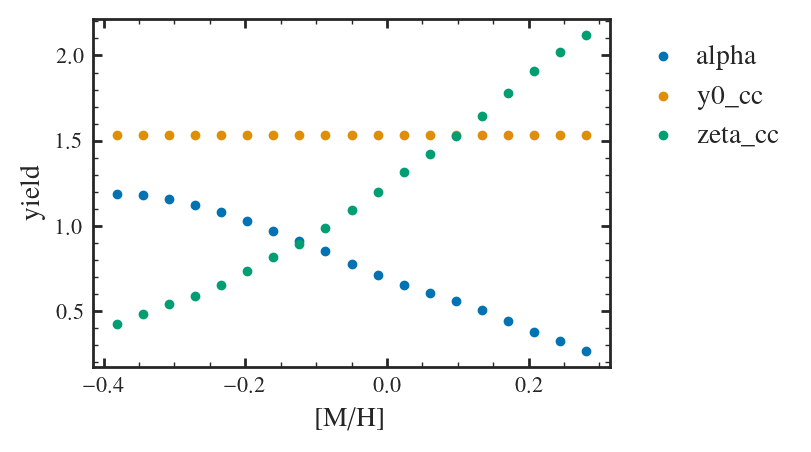

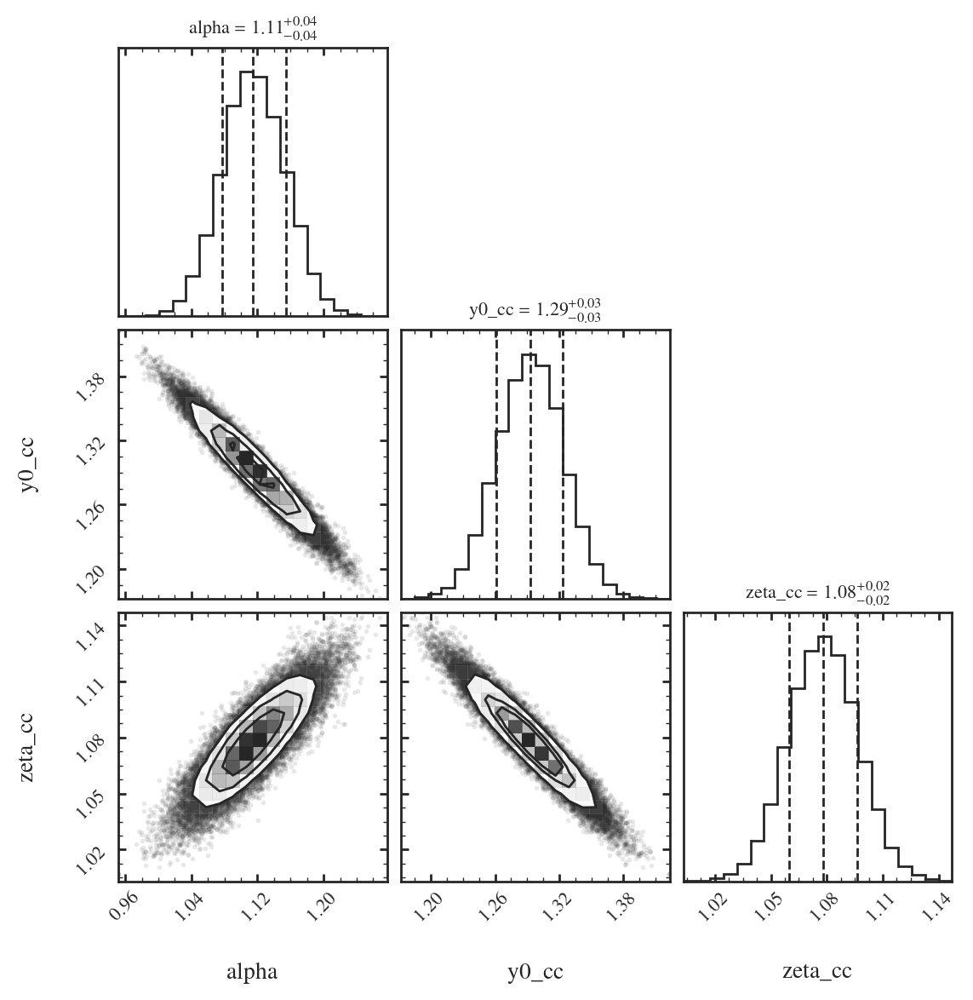

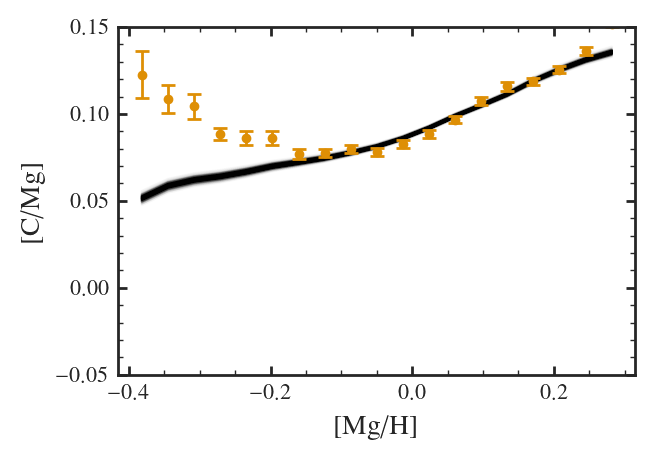

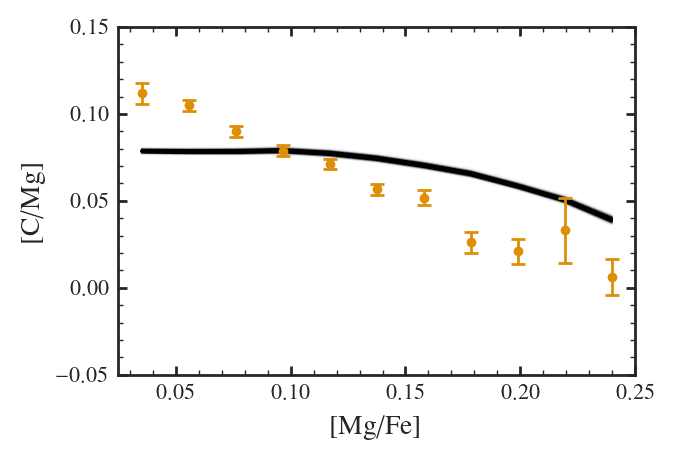

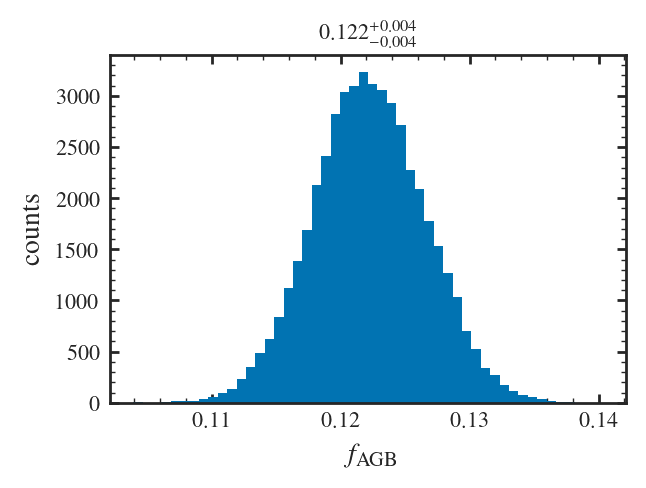

In [16]:
plot_all("monash", yagb_props["monash"])

In [33]:
make_new_params(y0_l=1.660, slope=0.968, alpha=0.879)

alpha_c_agb = 0.88
y0_c_cc = 2.63e-03
zeta_c_cc = 2.23e-03
f = 0.094


length of samples =  48000
{'alpha': {'name': 'perturbations/aton', 'prior': 'Normal', 'prior_args': [1.0, 1.0]}, 'y0_cc': {'name': 'perturbations/constant', 'prior': 'Normal', 'prior_args': [2.0, 1.0]}, 'zeta_cc': {'name': 'perturbations/linear', 'prior': 'Normal', 'prior_args': [0.0, 2.0], 'y0': 0.001}}
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 1.057	-0.029	+0.029	-0.089	+0.094
y0_cc   	 1.497	-0.020	+0.020	-0.065	+0.061
zeta_cc 	 1.122	-0.017	+0.017	-0.052	+0.055


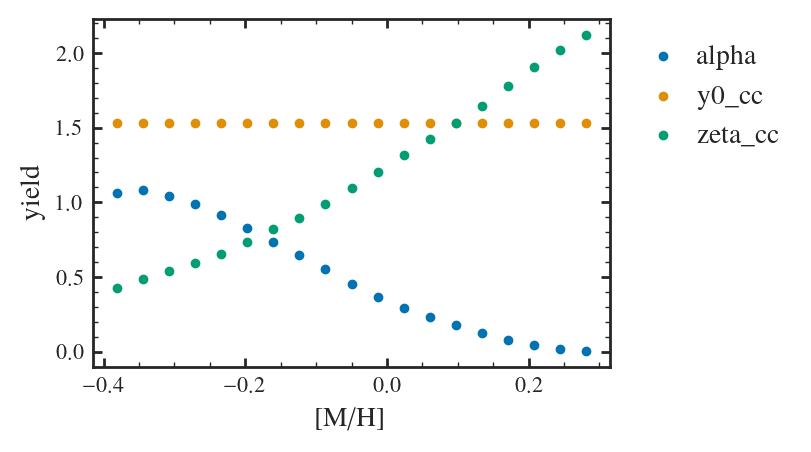

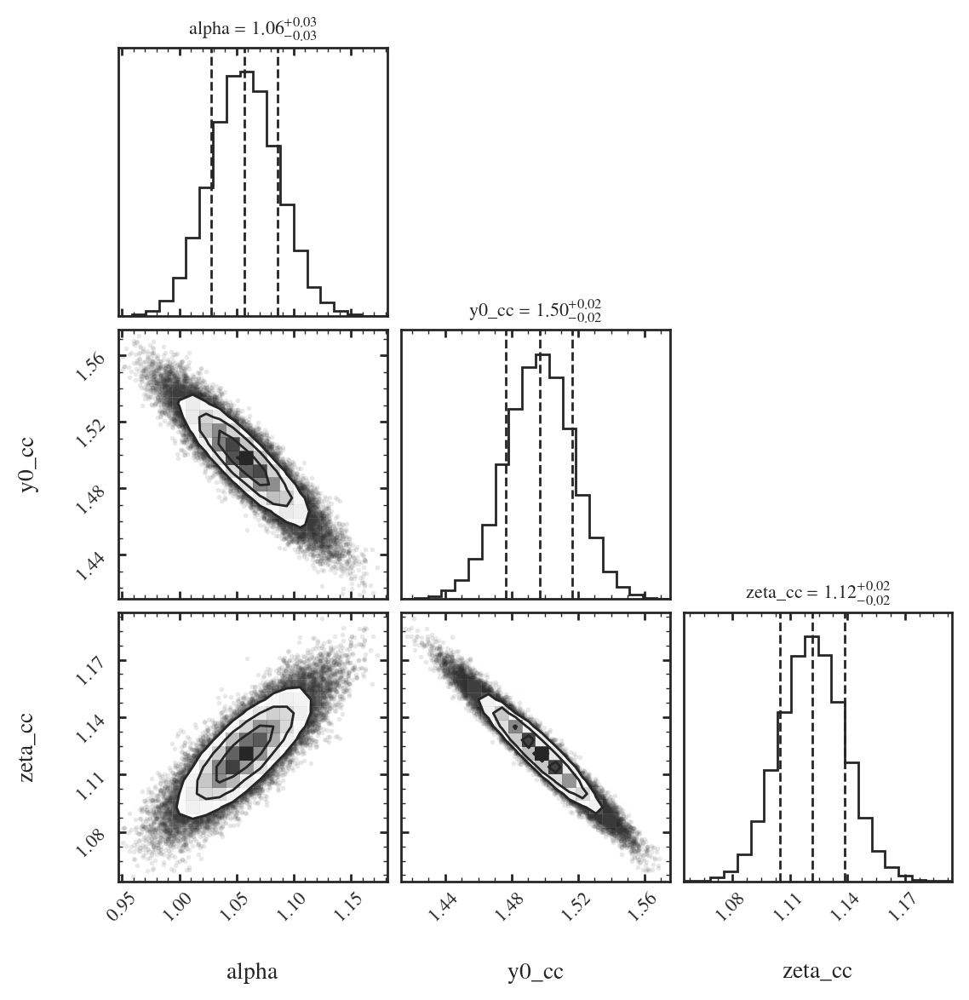

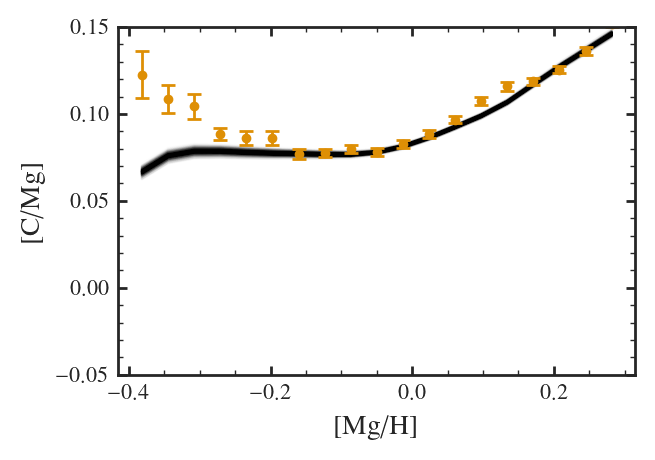

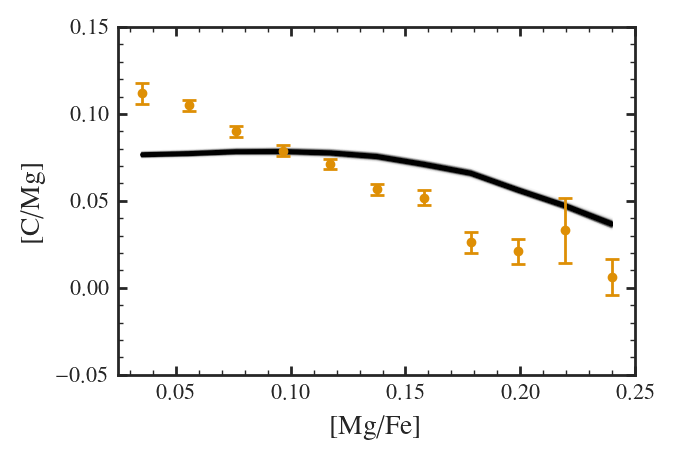

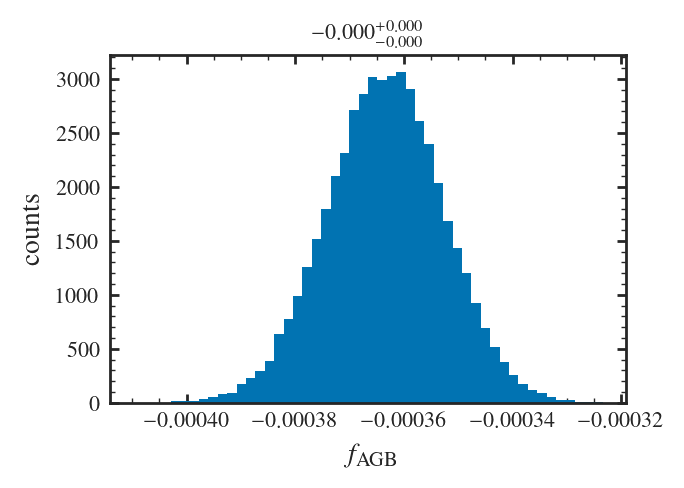

In [17]:
plot_all("aton", yagb_props["aton"])

In [17]:
make_new_params(y0_l=2.251, slope=0.509, alpha=1.010)

alpha_c_agb = 1.01
y0_c_cc = 2.76e-03
zeta_c_cc = 1.17e-03
f = 0.102


length of samples =  48000
{'alpha': {'name': 'perturbations/nugrid', 'prior': 'Normal', 'prior_args': [1.0, 1.0]}, 'y0_cc': {'name': 'perturbations/constant', 'prior': 'Normal', 'prior_args': [2.0, 1.0]}, 'zeta_cc': {'name': 'perturbations/linear', 'prior': 'Normal', 'prior_args': [0.0, 2.0], 'y0': 0.001}}
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 0.592	-0.017	+0.017	-0.056	+0.053
y0_cc   	 1.784	-0.013	+0.013	-0.042	+0.041
zeta_cc 	 0.450	-0.010	+0.010	-0.032	+0.032


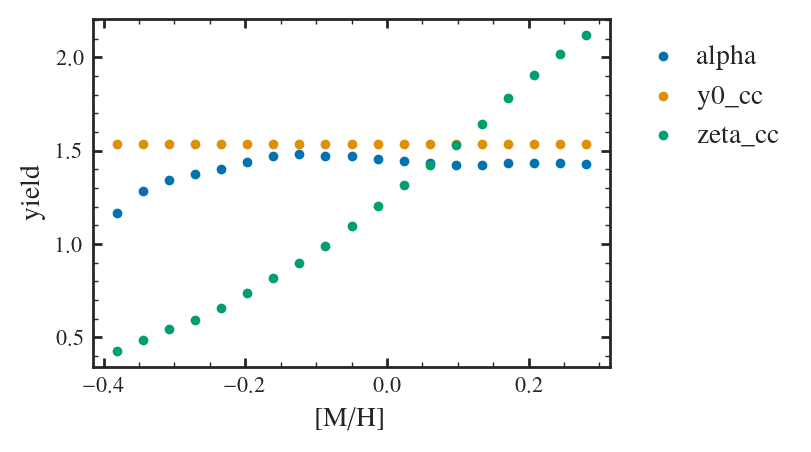

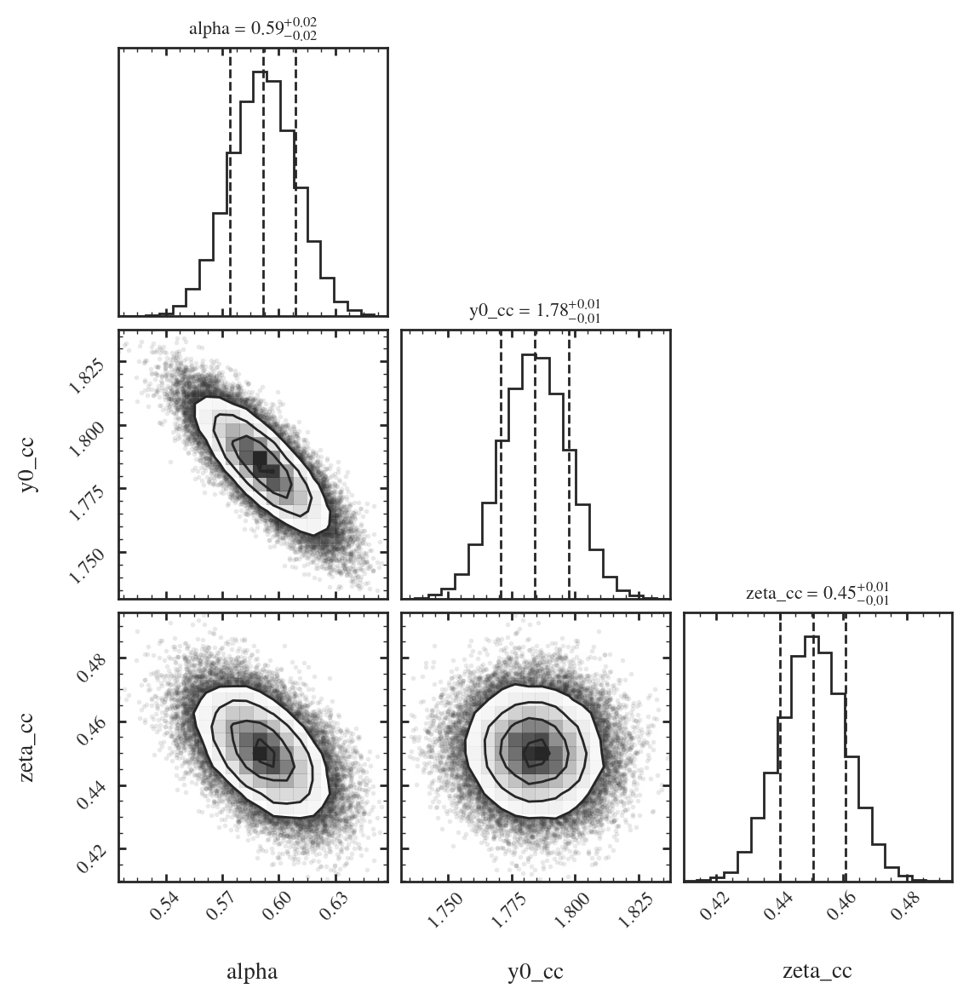

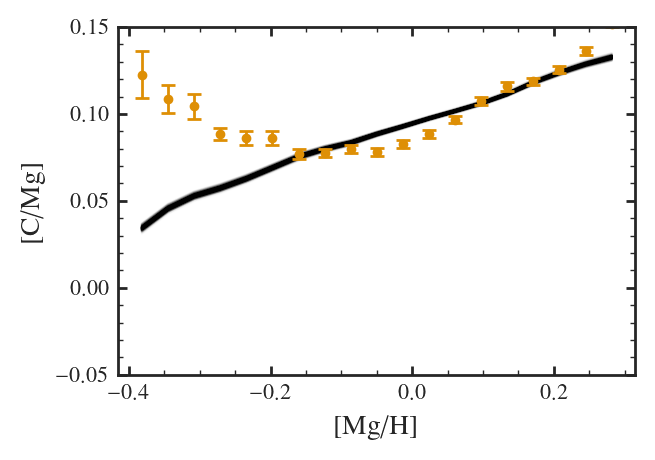

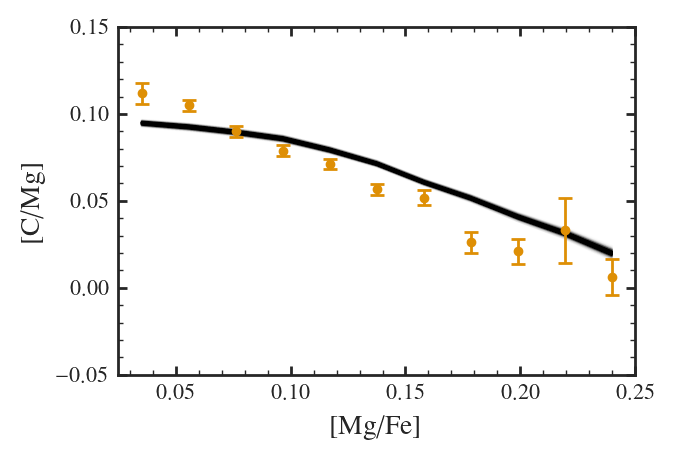

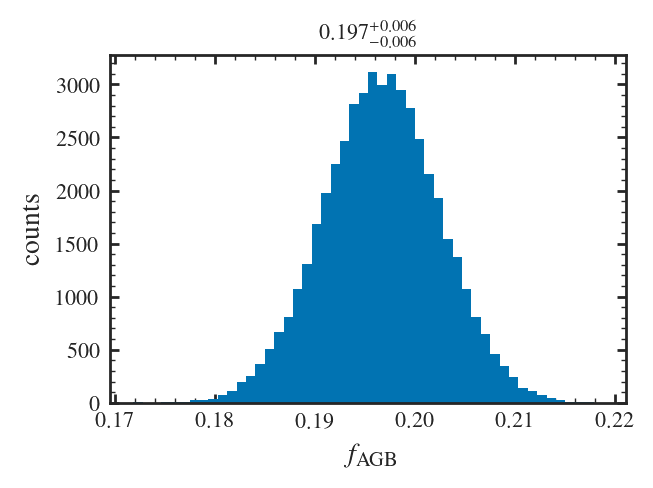

In [18]:
plot_all("nugrid", yagb_props["nugrid"])

length of samples =  48000
{'alpha': {'name': 'perturbations/fruity_mf0.7', 'prior': 'Normal', 'prior_args': [1.0, 1.0]}, 'y0_cc': {'name': 'perturbations/constant', 'prior': 'Normal', 'prior_args': [2.0, 1.0]}, 'zeta_cc': {'name': 'perturbations/linear', 'prior': 'Normal', 'prior_args': [0.0, 2.0], 'y0': 0.001}}
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 1.242	-0.031	+0.032	-0.099	+0.095
y0_cc   	 1.946	-0.011	+0.012	-0.035	+0.036
zeta_cc 	 0.378	-0.010	+0.010	-0.031	+0.030


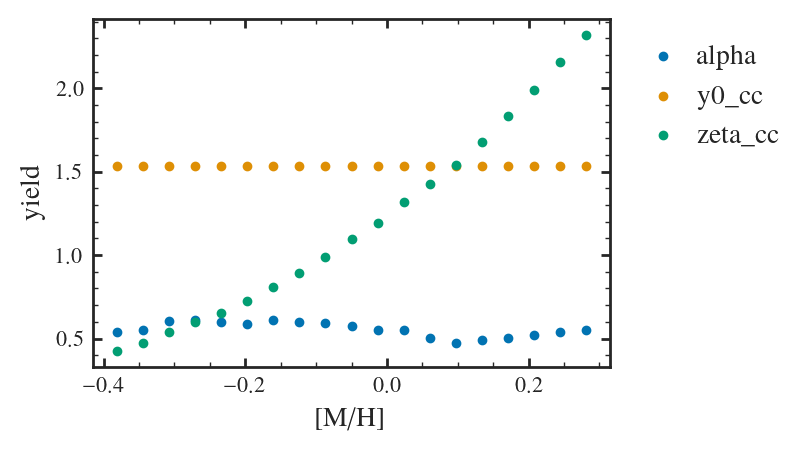

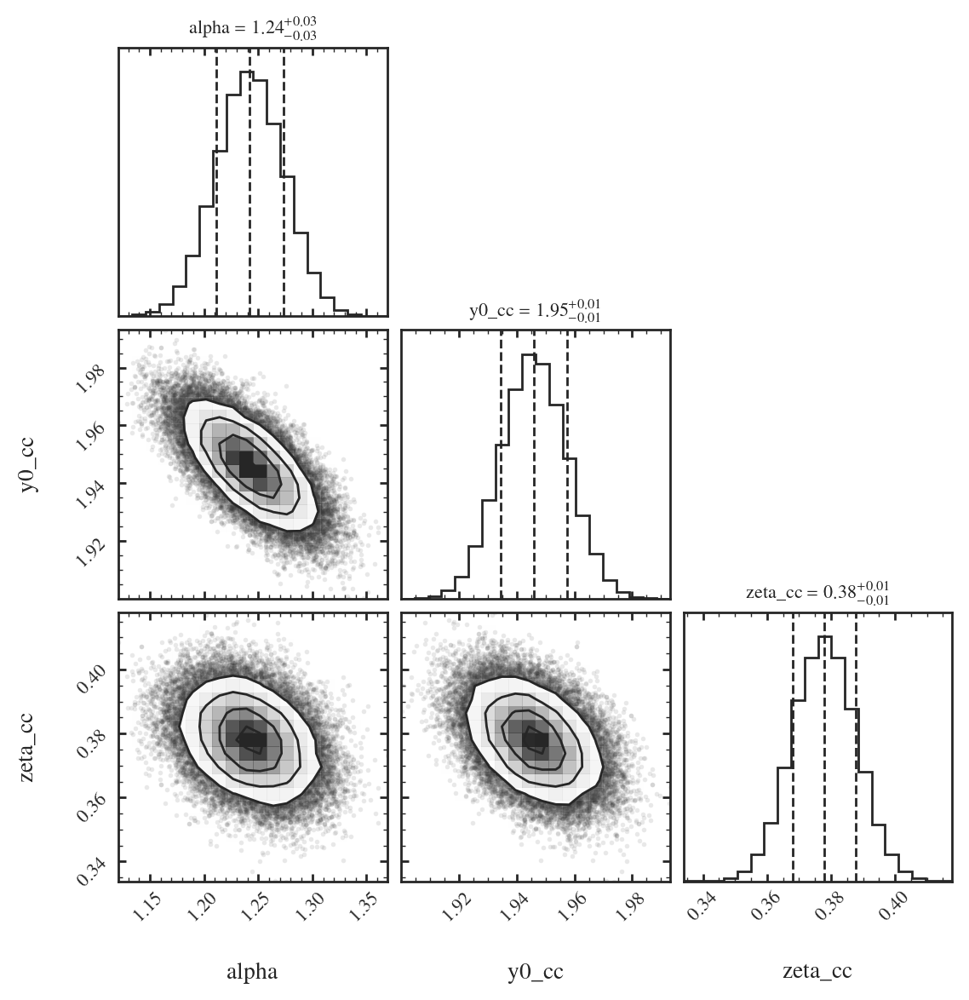

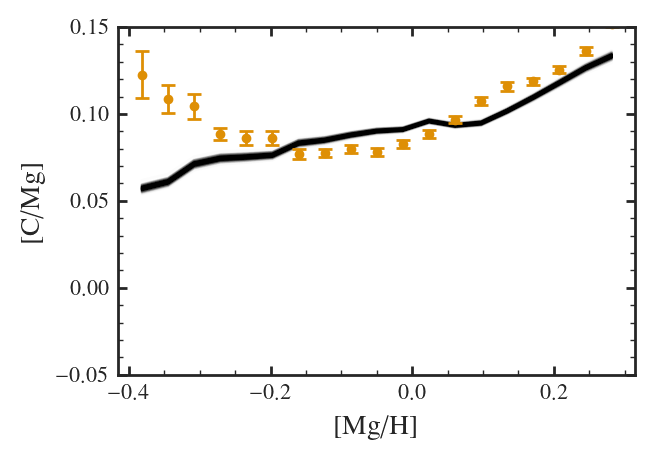

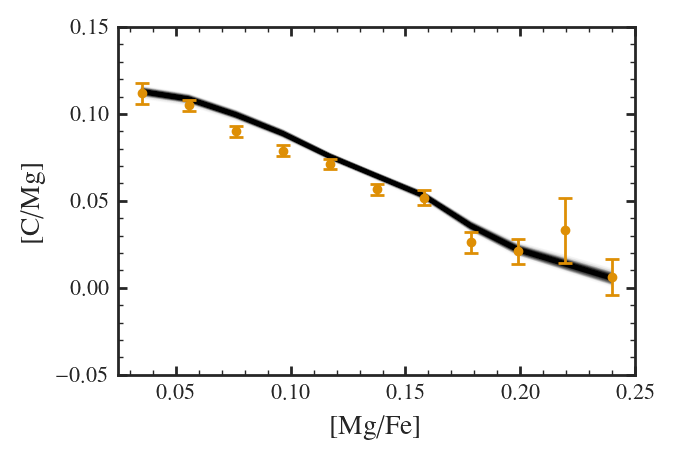

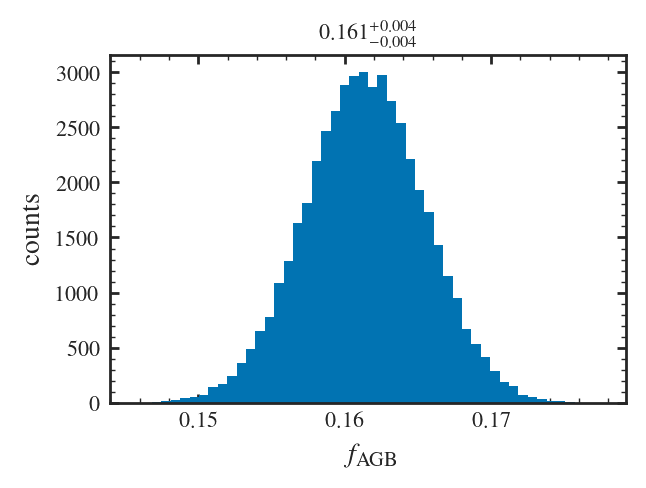

In [20]:
plot_all("fruity_mf0.7", yagb_props["fruity_mf0.7"])

adding  alpha
length of samples =  48000
{'alpha': {'name': 'perturbations/fruity_mf0.5', 'prior': 'Normal', 'prior_args': [2.98, 0.0]}, 'y0_cc': {'name': 'perturbations/constant', 'prior': 'Normal', 'prior_args': [2.0, 1.0]}, 'zeta_cc': {'name': 'perturbations/linear', 'prior': 'Normal', 'prior_args': [0.0, 2.0], 'y0': 0.001}}
parameter	 med	 16th	 84th	0.1th	99.9th
y0_cc   	 2.060	-0.009	+0.009	-0.026	+0.026
zeta_cc 	 0.145	-0.010	+0.010	-0.030	+0.030
alpha   	 2.980


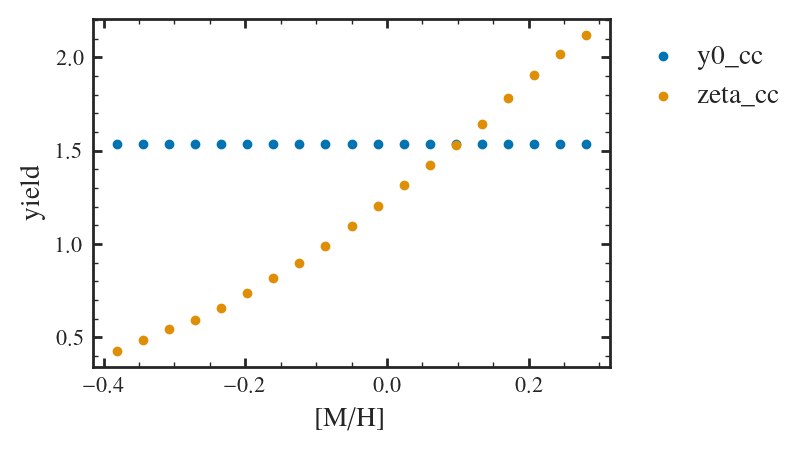

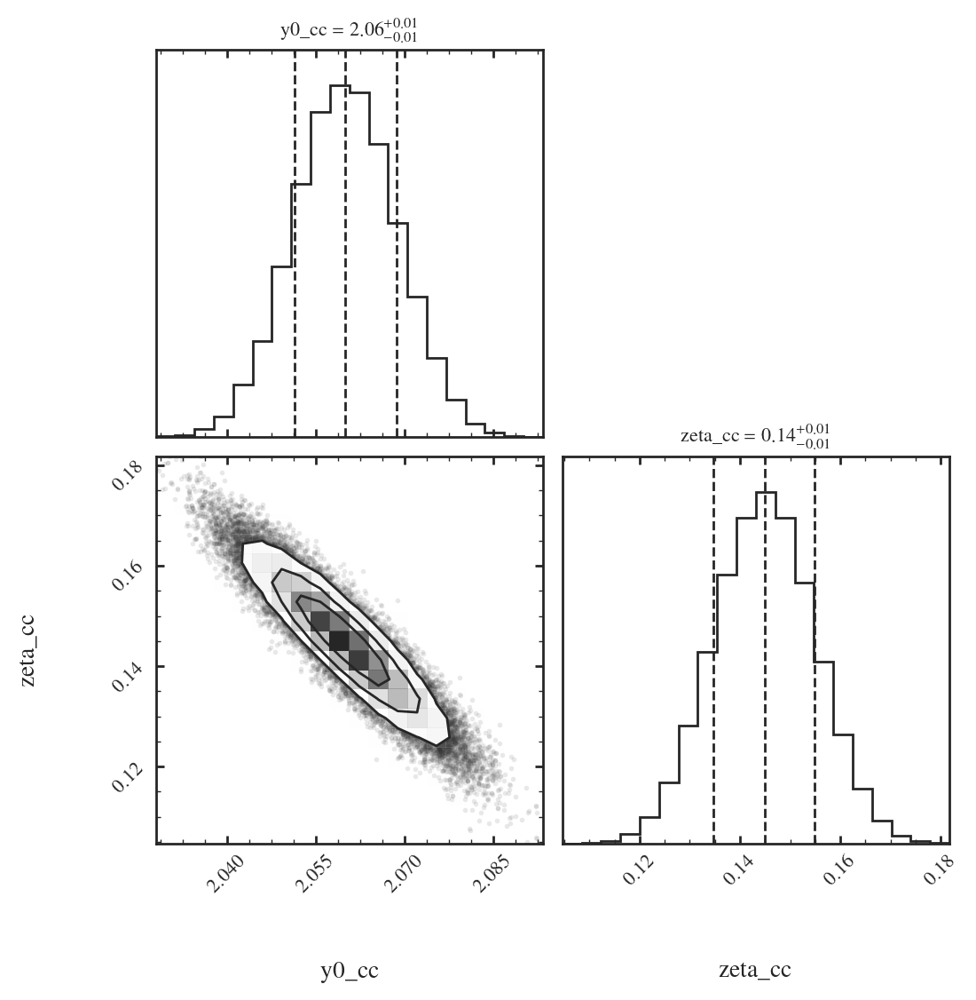

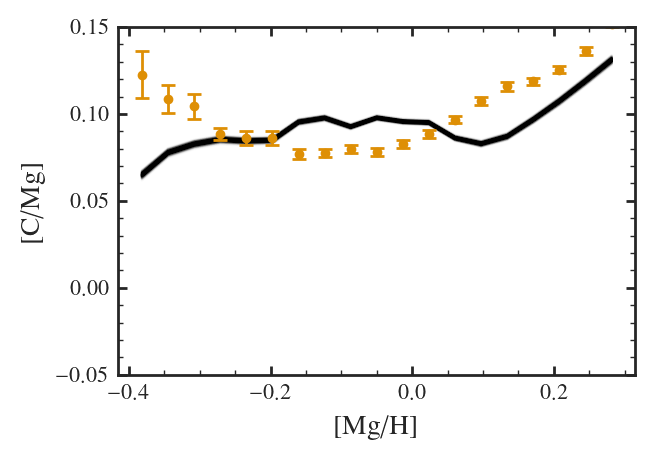

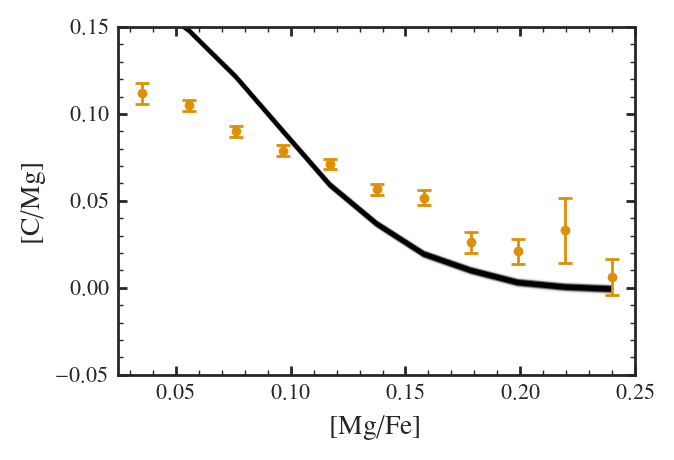

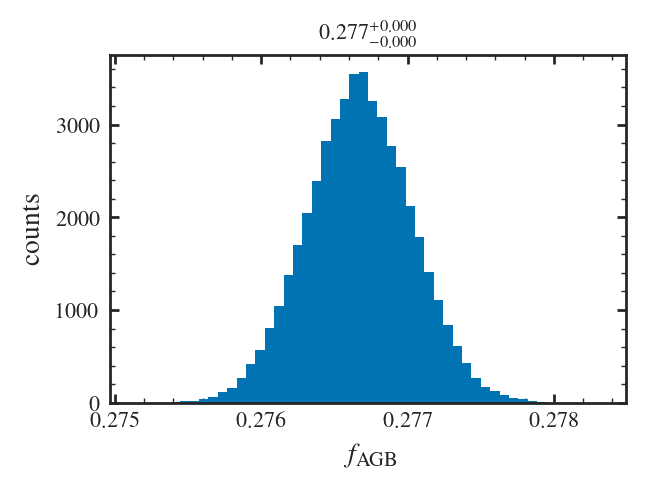

In [16]:
plot_all("fruity_mf0.5_fixed", yagb_props["fruity_mf0.5"])

adding  alpha
length of samples =  48000
{'alpha': {'name': 'perturbations/fruity_mf0.7', 'prior': 'Normal', 'prior_args': [2.34, 0.0]}, 'y0_cc': {'name': 'perturbations/constant', 'prior': 'Normal', 'prior_args': [2.0, 1.0]}, 'zeta_cc': {'name': 'perturbations/linear', 'prior': 'Normal', 'prior_args': [0.0, 2.0], 'y0': 0.001}}
parameter	 med	 16th	 84th	0.1th	99.9th
y0_cc   	 1.655	-0.008	+0.008	-0.026	+0.025
zeta_cc 	 0.315	-0.009	+0.009	-0.027	+0.029
alpha   	 2.340


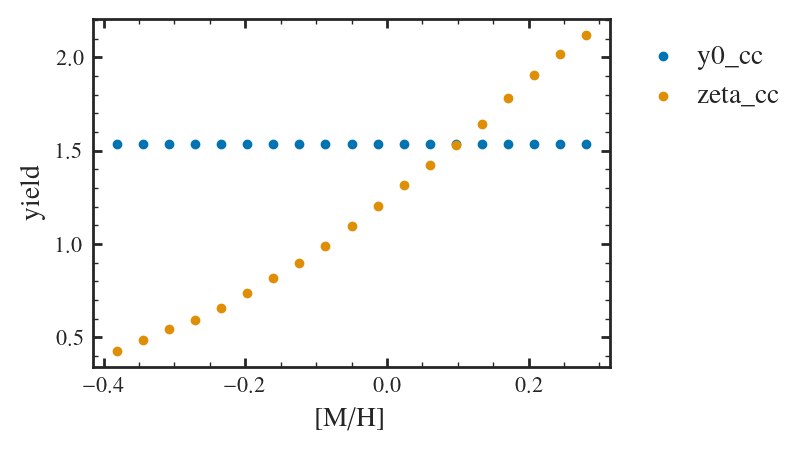

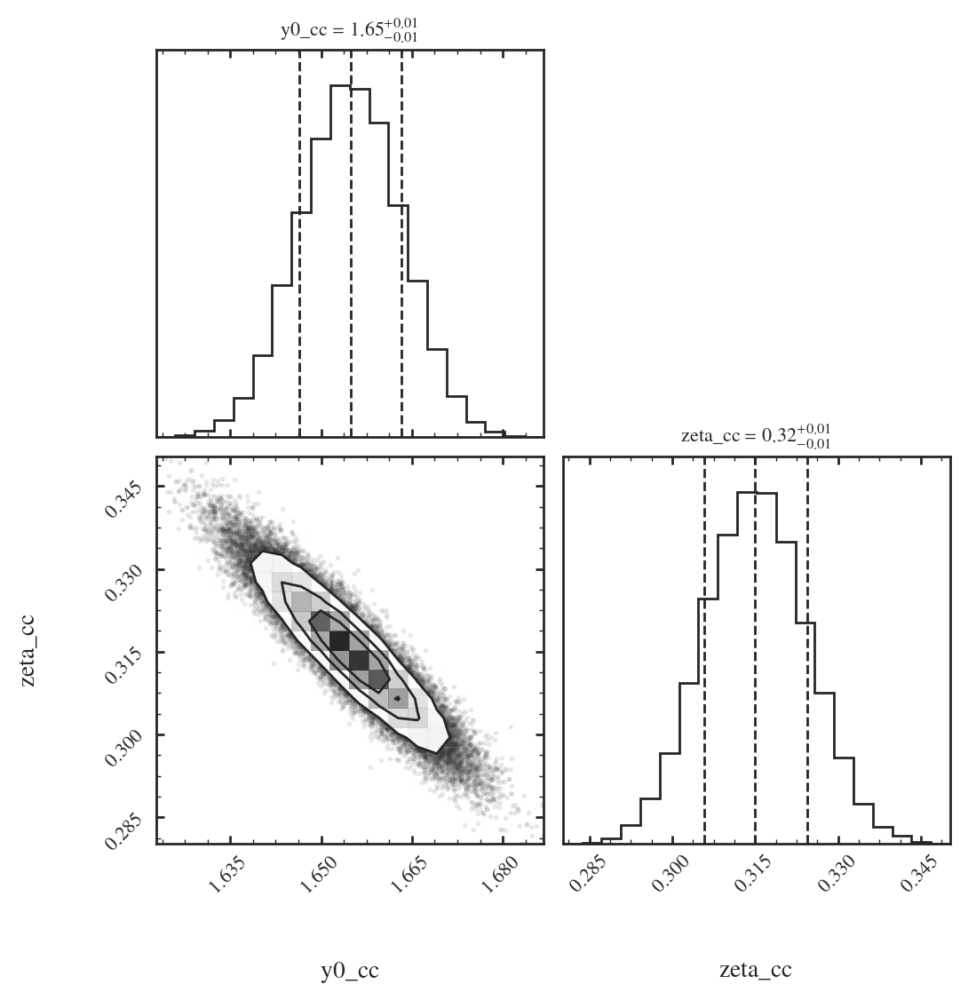

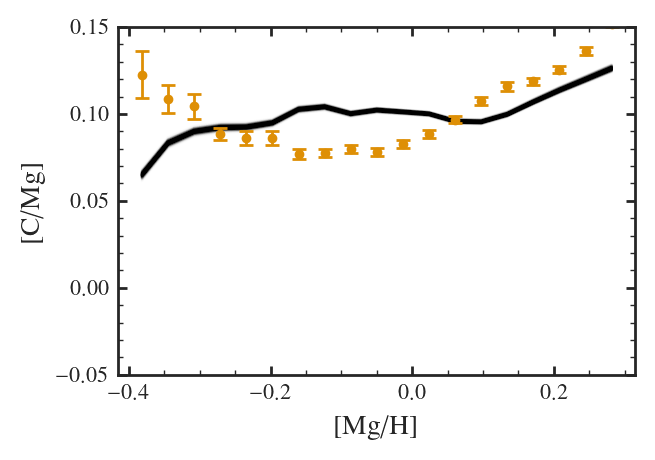

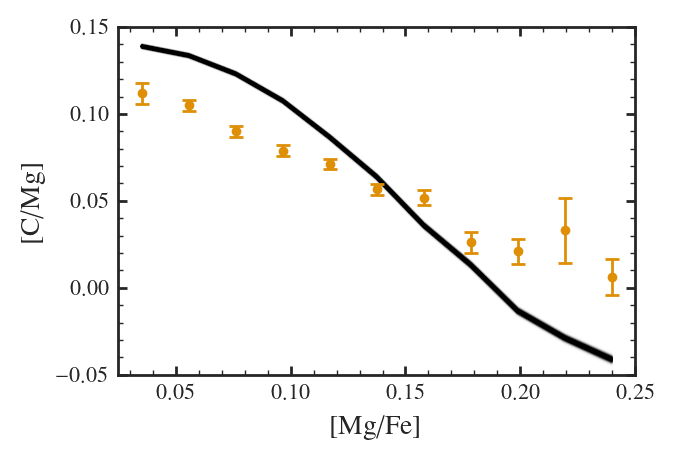

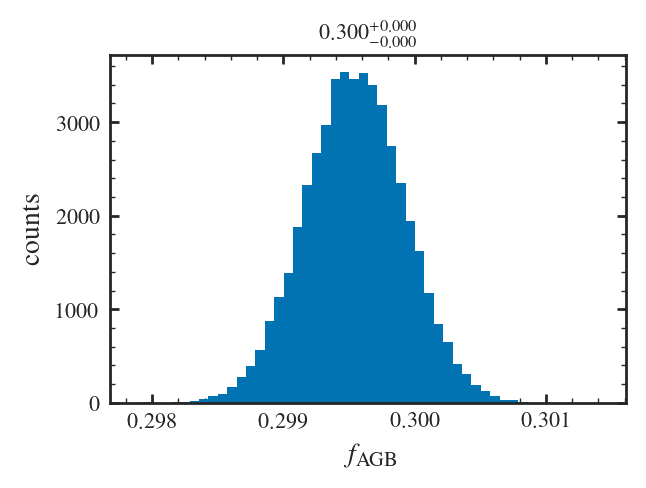

In [17]:
plot_all("fruity_mf0.7_fixed", yagb_props["fruity_mf0.7"])

adding  alpha
length of samples =  48000
{'alpha': {'name': 'perturbations/fruity_mf1.5', 'prior': 'Normal', 'prior_args': [2.71, 0.0]}, 'y0_cc': {'name': 'perturbations/constant', 'prior': 'Normal', 'prior_args': [2.0, 1.0]}, 'zeta_cc': {'name': 'perturbations/linear', 'prior': 'Normal', 'prior_args': [0.0, 2.0], 'y0': 0.001}}
parameter	 med	 16th	 84th	0.1th	99.9th
y0_cc   	 1.011	-0.009	+0.009	-0.027	+0.026
zeta_cc 	 0.846	-0.010	+0.010	-0.029	+0.030
alpha   	 2.710


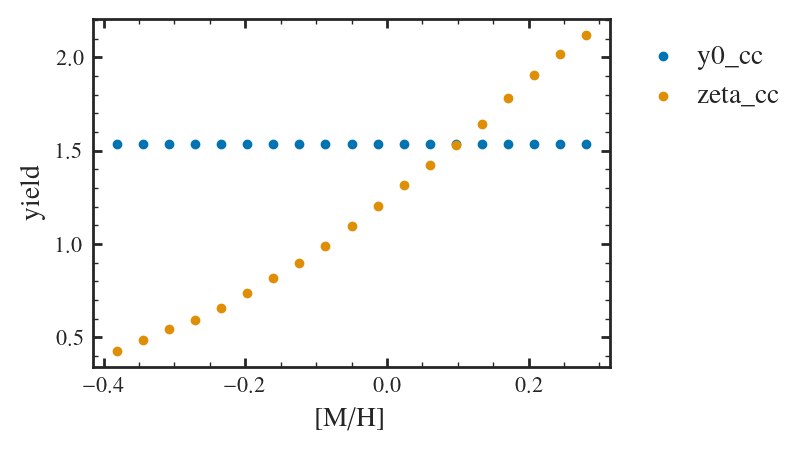

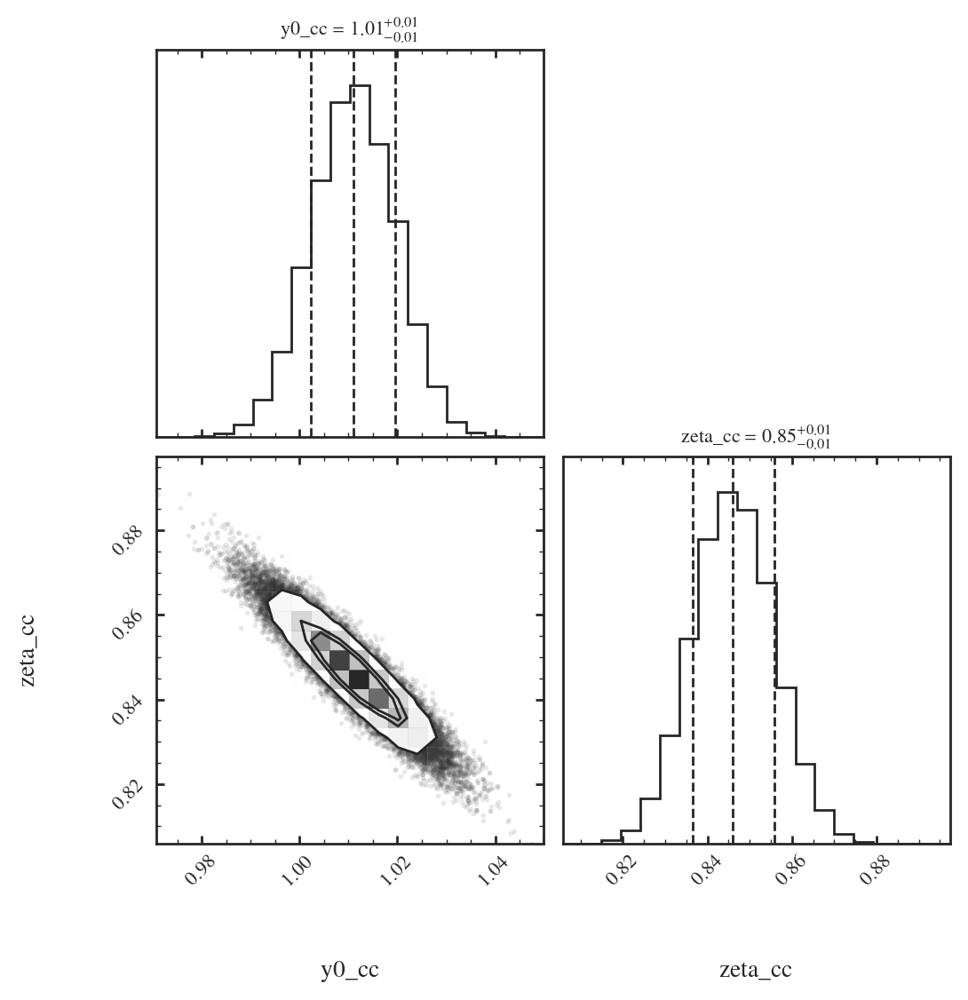

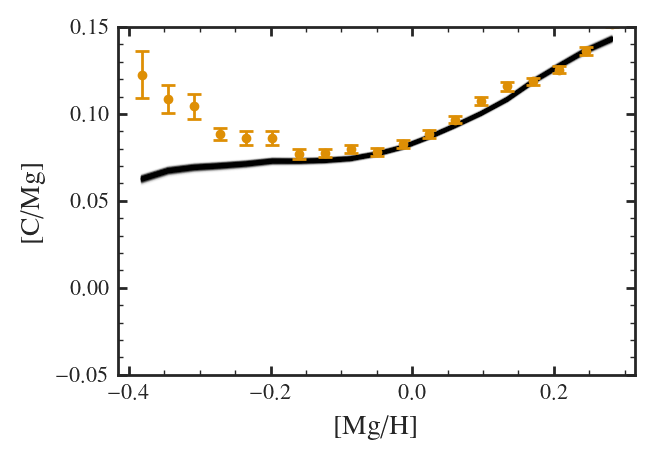

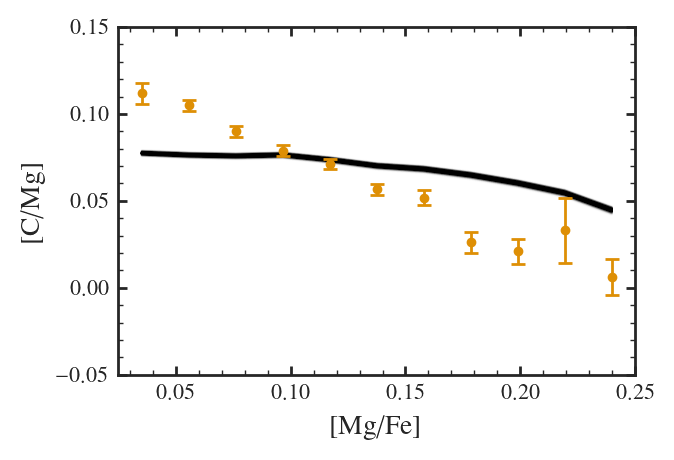

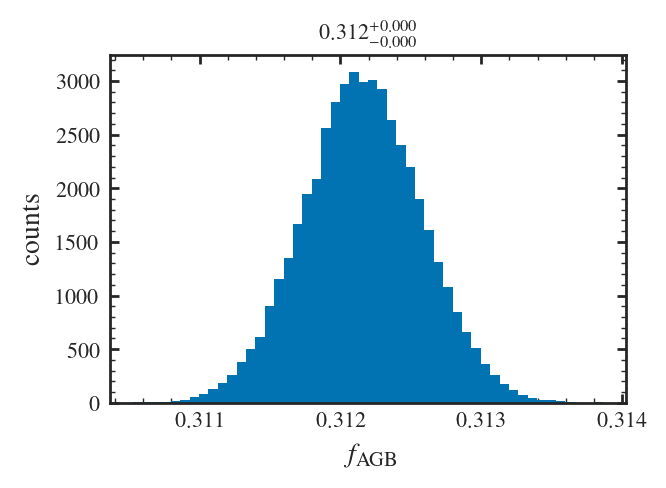

In [18]:
plot_all("fruity_mf1.5_fixed", yagb_props["fruity_mf1.5"])

## Othet yields

length of samples =  48000
{'alpha': {'name': 'perturbations/fruity', 'prior': 'Normal', 'prior_args': [1.0, 1.0]}, 'y0_cc': {'name': 'perturbations/constant', 'prior': 'Normal', 'prior_args': [2.0, 1.0]}, 'zeta_cc': {'name': 'perturbations/linear', 'prior': 'Normal', 'prior_args': [0.0, 2.0], 'y0': 0.001}}
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 1.434	-0.039	+0.040	-0.122	+0.121
y0_cc   	 1.623	-0.019	+0.019	-0.061	+0.059
zeta_cc 	 0.630	-0.010	+0.010	-0.030	+0.032


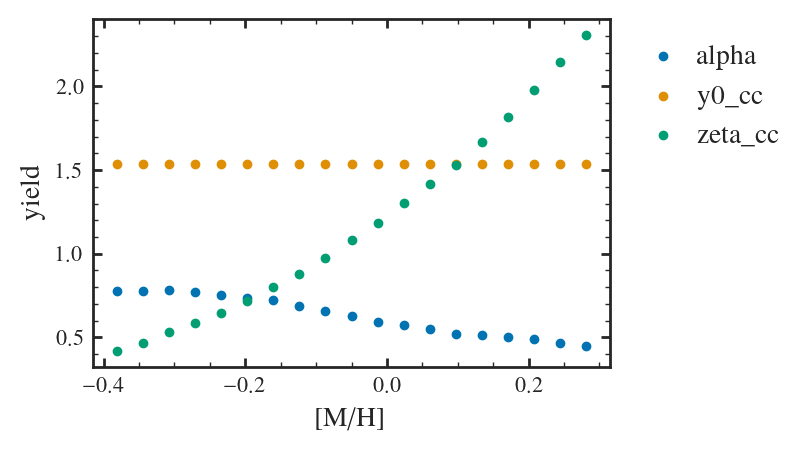

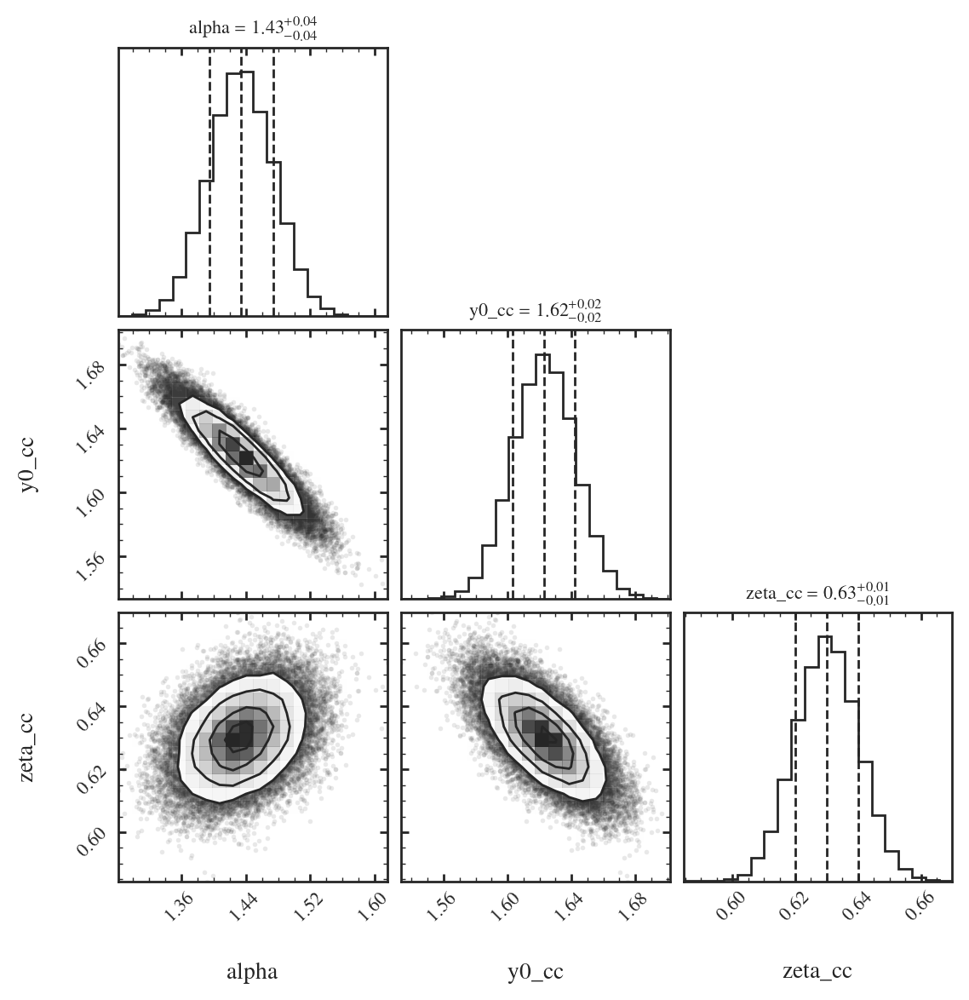

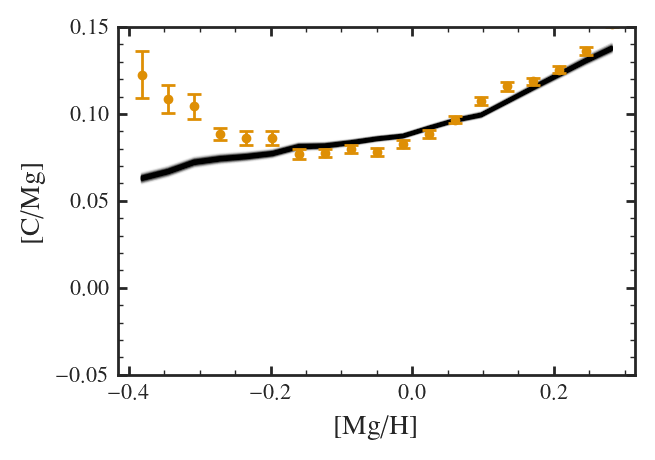

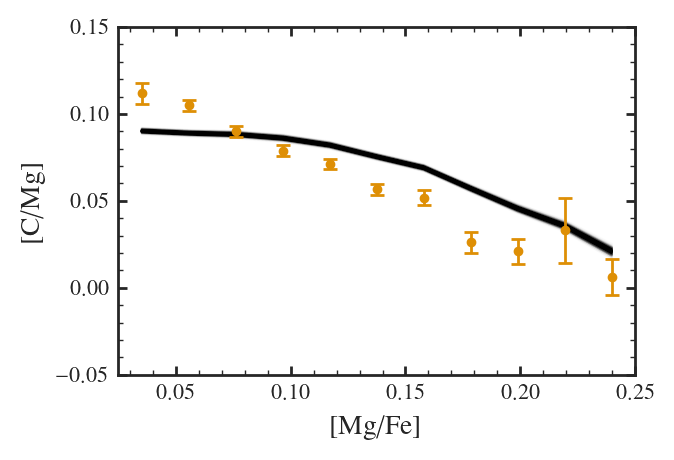

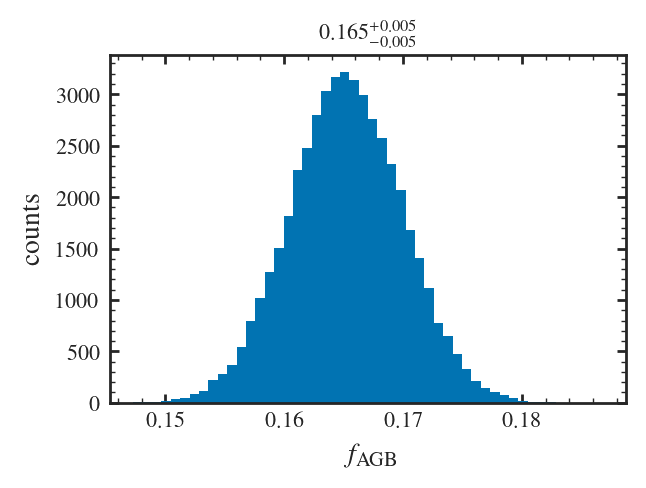

In [12]:
plot_all("fiducial", yagb_props["fruity"])

length of samples =  48000
{'alpha': {'name': 'perturbations/fruity', 'prior': 'Normal', 'prior_args': [1.0, 1.0]}, 'y0_cc': {'name': 'perturbations/constant', 'prior': 'Normal', 'prior_args': [2.0, 1.0]}, 'zeta_cc': {'name': 'perturbations/linear', 'prior': 'Normal', 'prior_args': [0.0, 2.0], 'y0': 0.001}}
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 1.434	-0.039	+0.040	-0.122	+0.121
y0_cc   	 1.623	-0.019	+0.019	-0.061	+0.059
zeta_cc 	 0.630	-0.010	+0.010	-0.030	+0.032


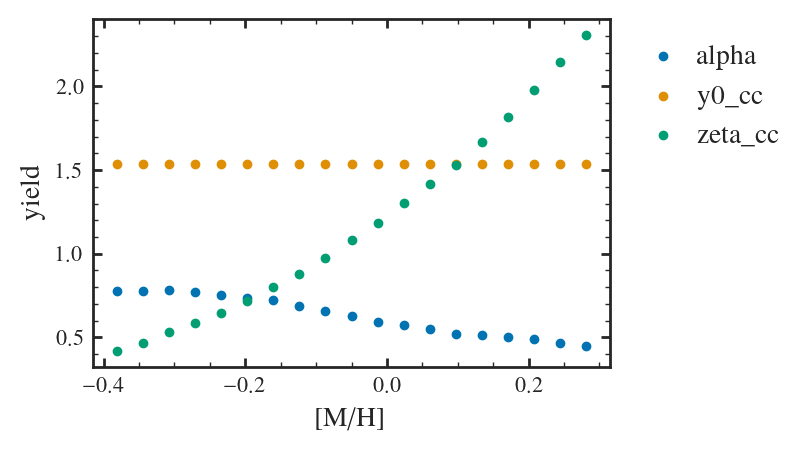

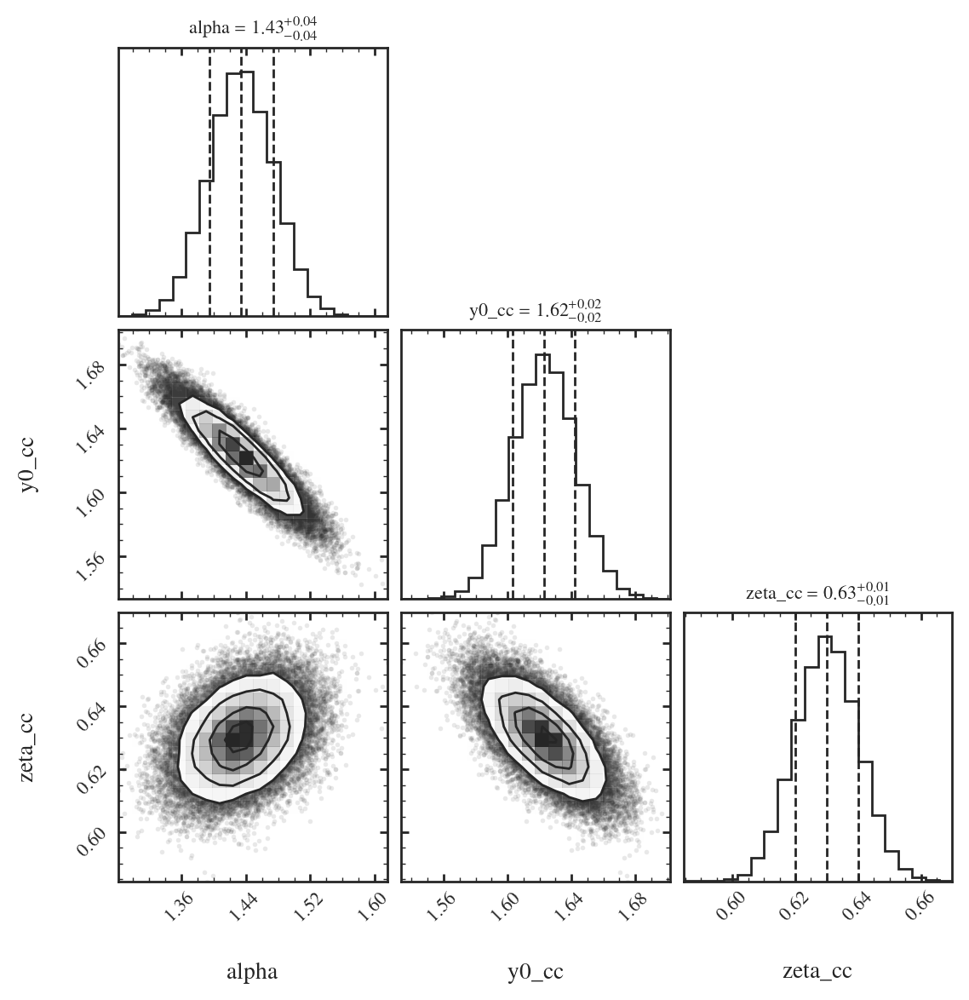

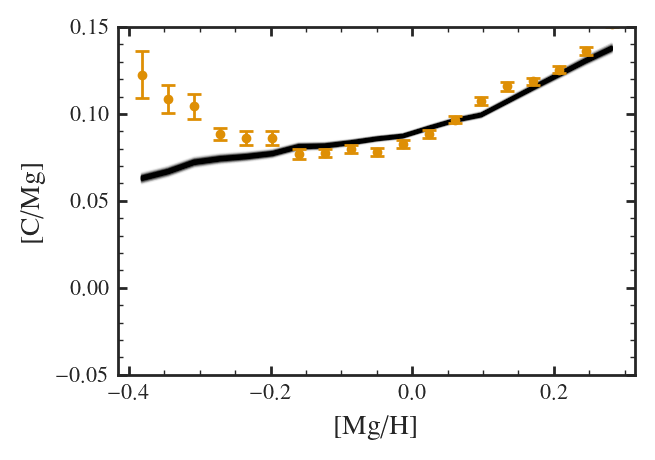

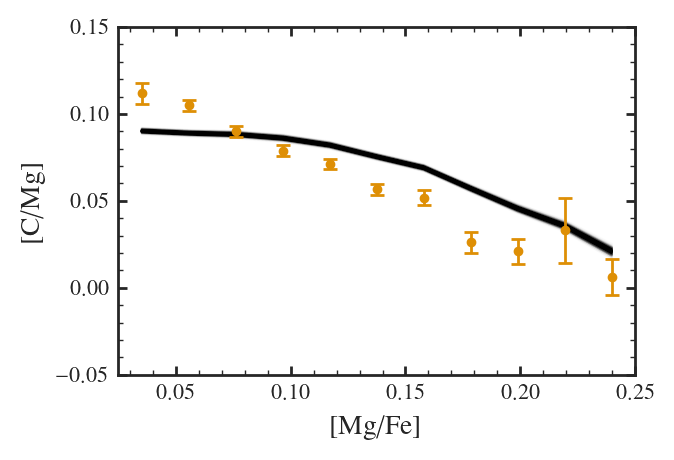

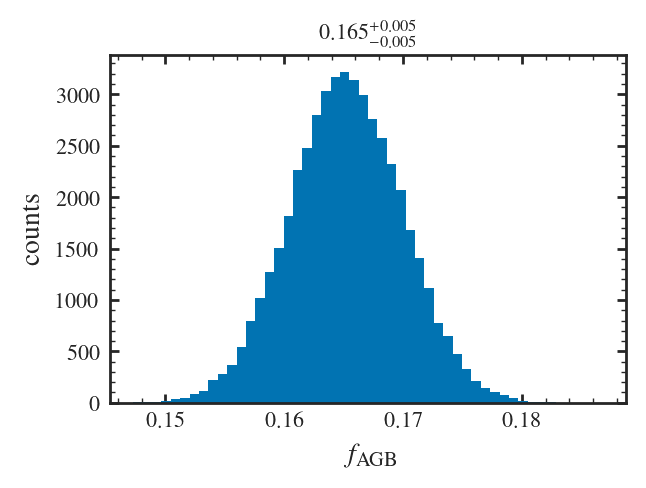

In [13]:
plot_all("fiducial", yagb_props["fruity"])

length of samples =  48000
{'alpha': {'name': 'perturbations/fruity', 'prior': 'Normal', 'prior_args': [1.0, 1.0]}, 'y0_cc': {'name': 'perturbations/constant', 'prior': 'Normal', 'prior_args': [2.0, 1.0]}, 'zeta_cc': {'name': 'perturbations/linear', 'prior': 'Normal', 'prior_args': [0.0, 2.0], 'y0': 0.001}}
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 1.544	-0.096	+0.097	-0.304	+0.303
y0_cc   	 1.743	-0.039	+0.039	-0.123	+0.119
zeta_cc 	 0.433	-0.038	+0.039	-0.117	+0.120


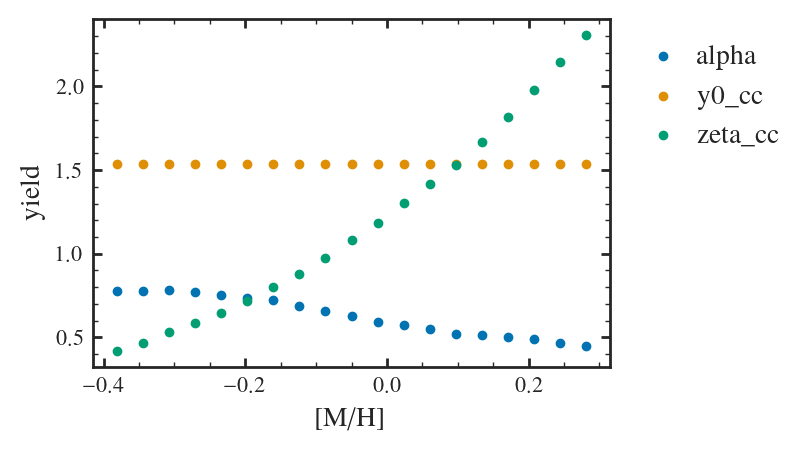

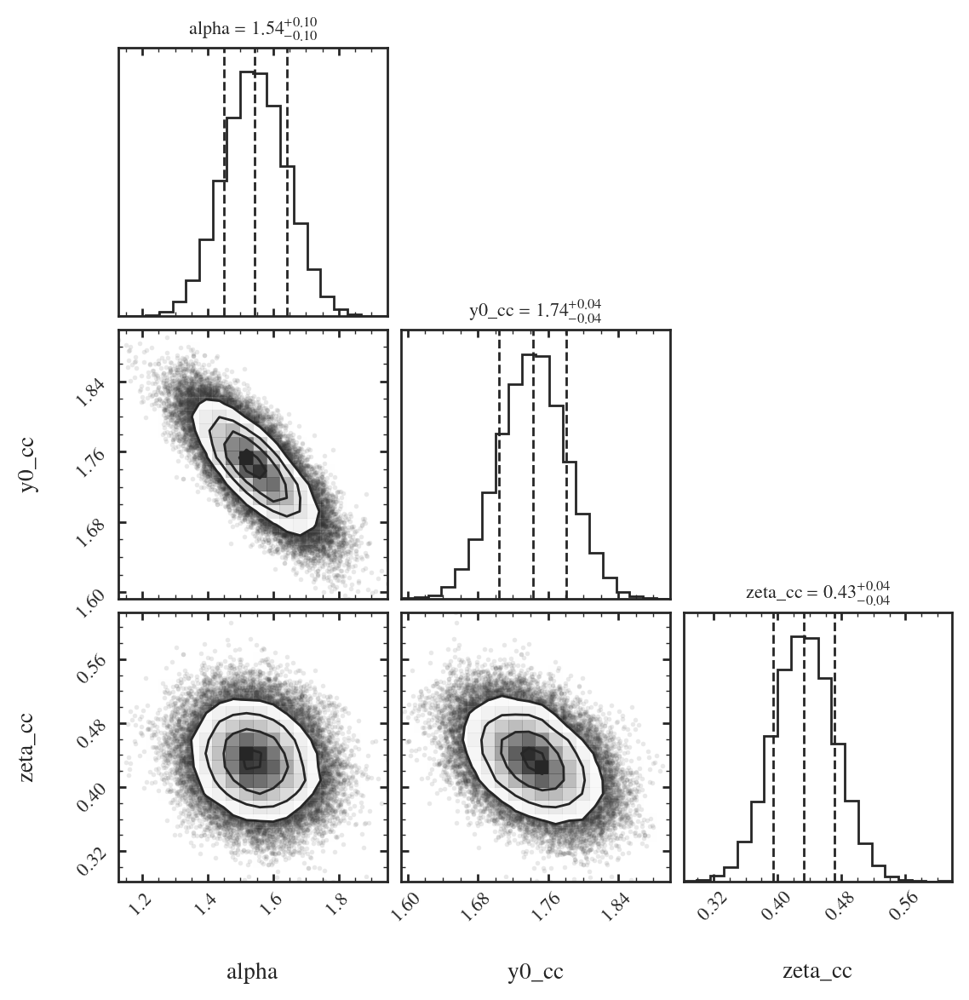

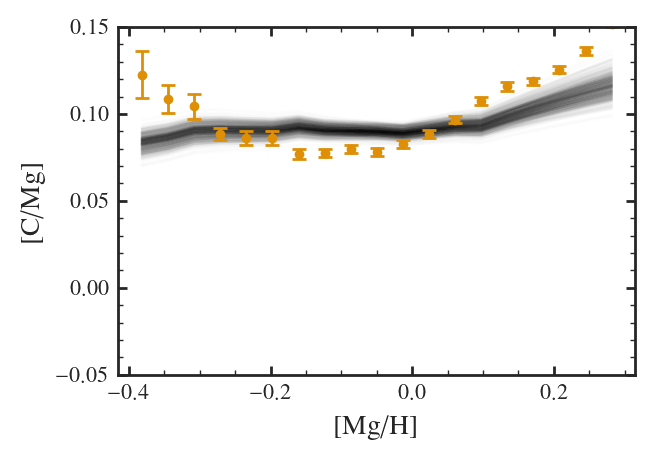

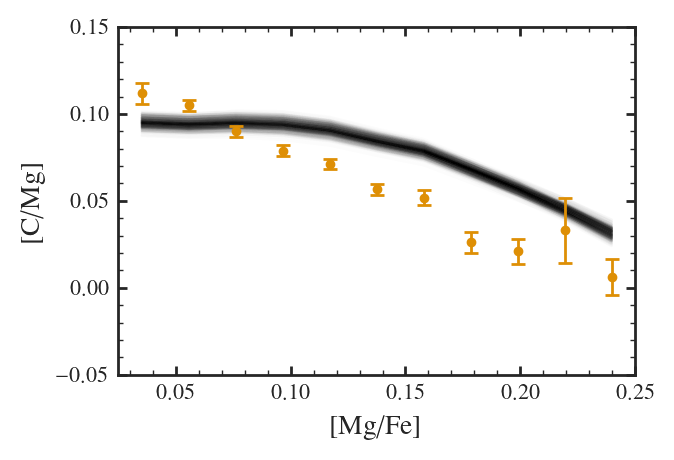

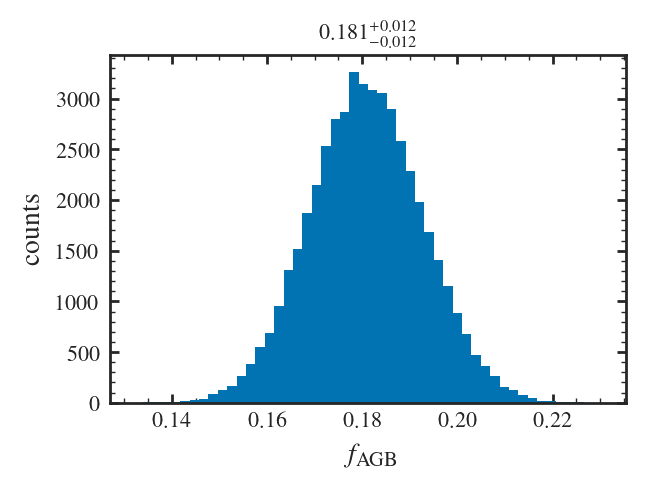

In [60]:
plot_all("fiducial_sigma0.02", yagb_props["fruity"])

length of samples =  48000
{'alpha': {'name': 'perturbations/fruity', 'prior': 'Normal', 'prior_args': [1.0, 1.0]}, 'y0_cc': {'name': 'perturbations/constant', 'prior': 'Normal', 'prior_args': [2.0, 1.0]}, 'zeta_cc': {'name': 'perturbations/linear', 'prior': 'Normal', 'prior_args': [0.0, 2.0], 'y0': 0.001}}
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 1.453	-0.042	+0.042	-0.130	+0.132
y0_cc   	 1.601	-0.021	+0.020	-0.064	+0.065
zeta_cc 	 0.640	-0.010	+0.010	-0.033	+0.032


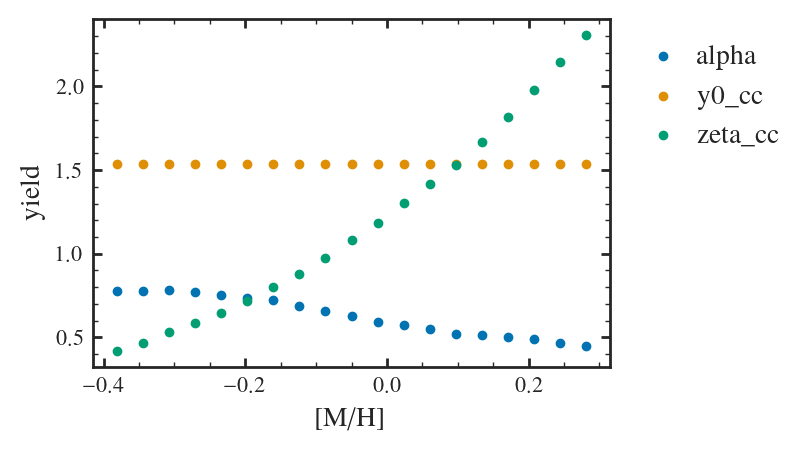

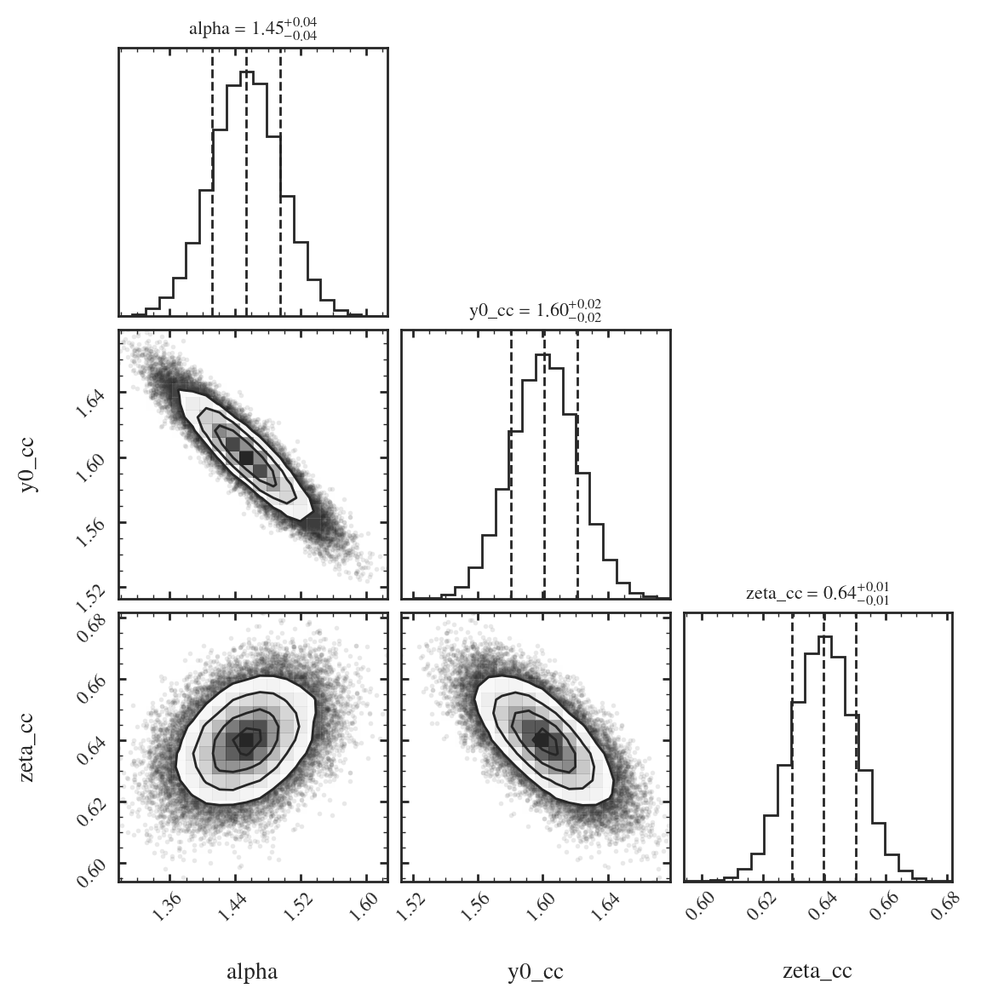

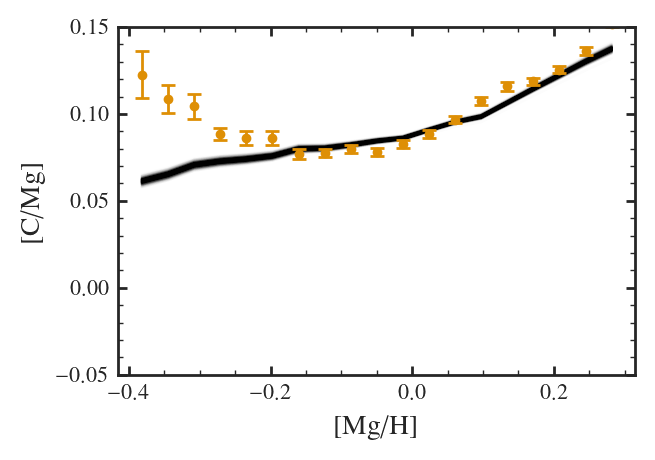

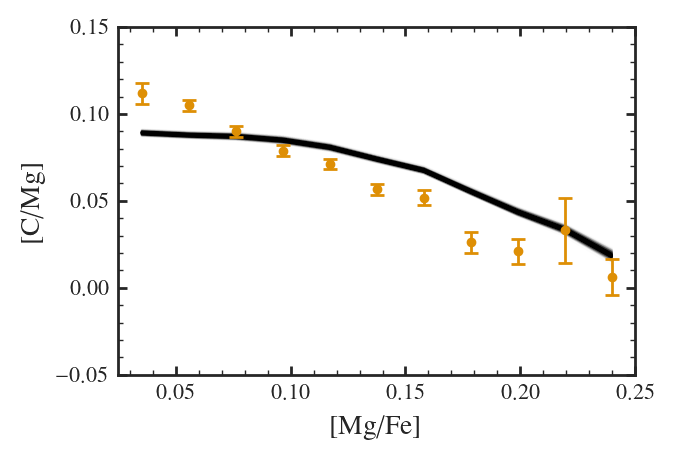

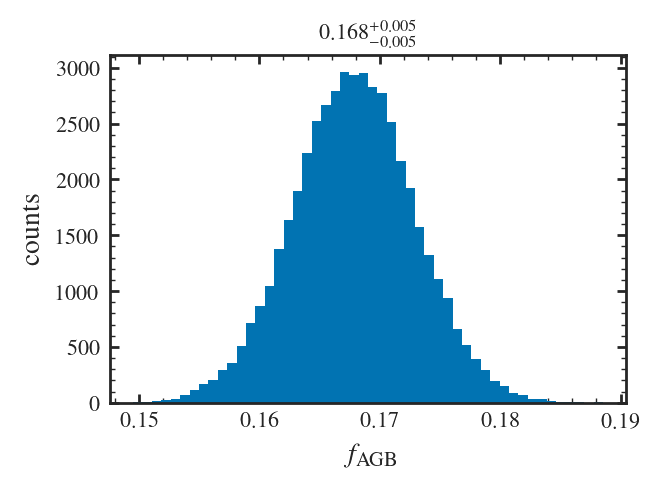

In [62]:
plot_all("fiducial_lin", yagb_props["fruity"])

length of samples =  48000
{'alpha': {'name': 'perturbations/fruity', 'prior': 'Normal', 'prior_args': [1.0, 1.0]}, 'y0_cc': {'name': 'perturbations/constant', 'prior': 'Normal', 'prior_args': [0.79, 0.01]}, 'zeta_cc': {'name': 'perturbations/linear', 'prior': 'Normal', 'prior_args': [0.0, 2.0], 'y0': 0.001}}
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 2.637	-0.024	+0.024	-0.075	+0.076
y0_cc   	 0.989	-0.008	+0.009	-0.026	+0.026
zeta_cc 	 0.839	-0.008	+0.008	-0.026	+0.025


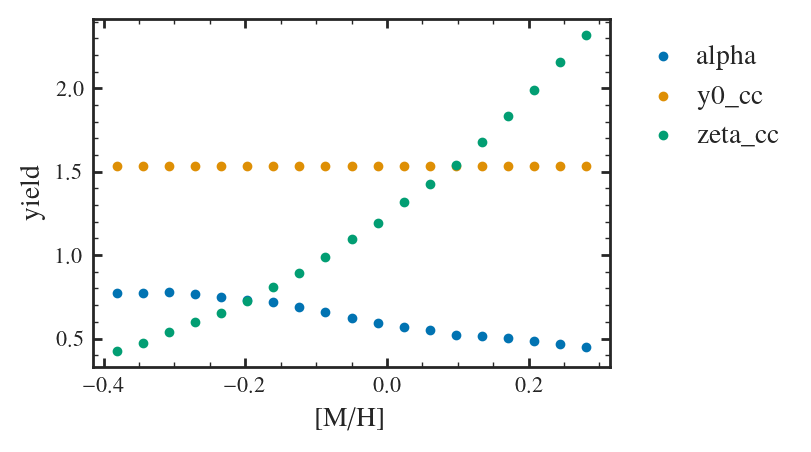

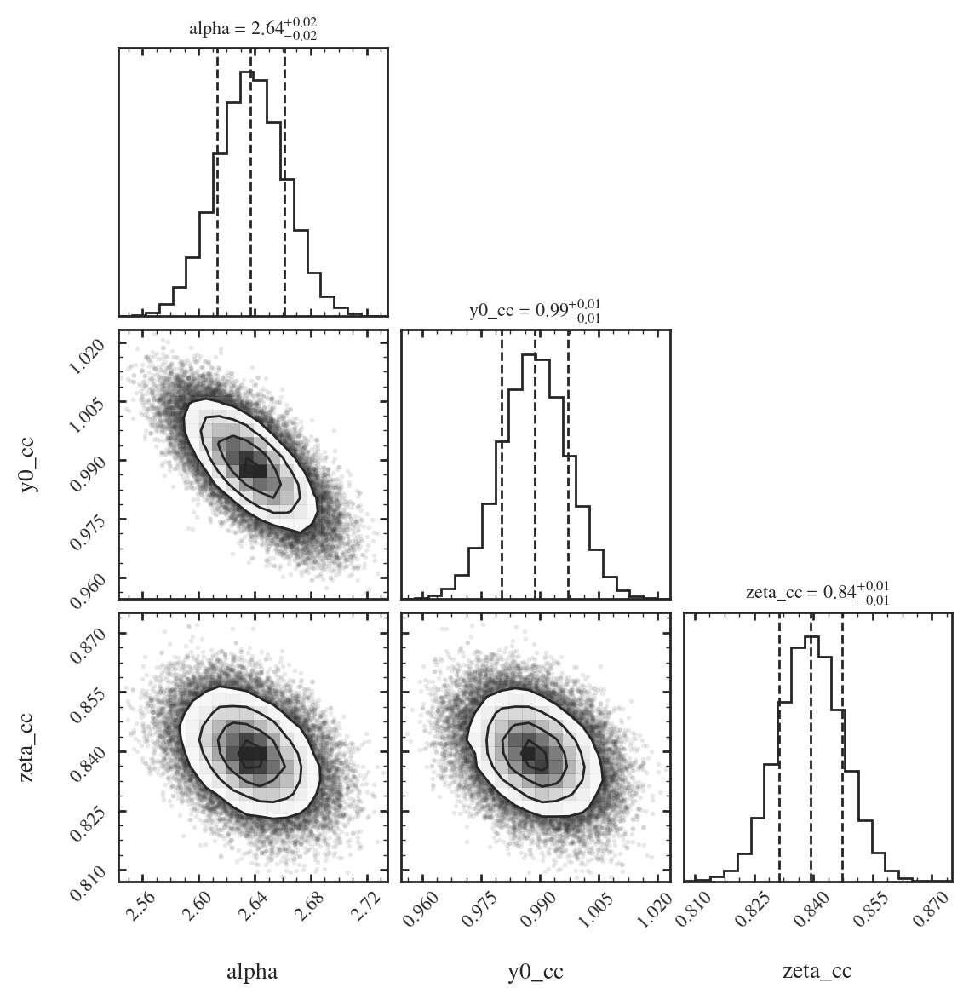

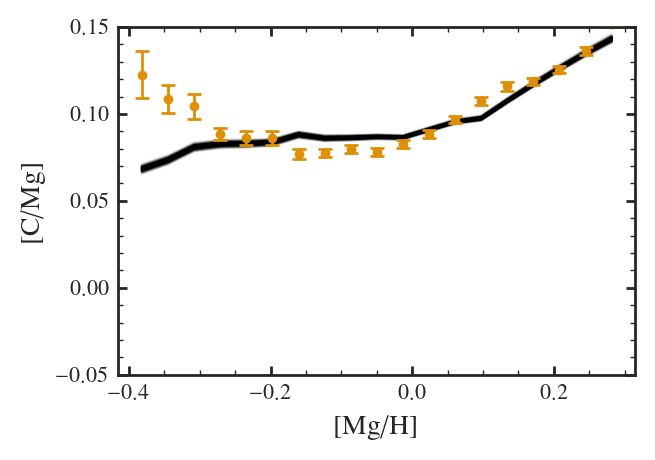

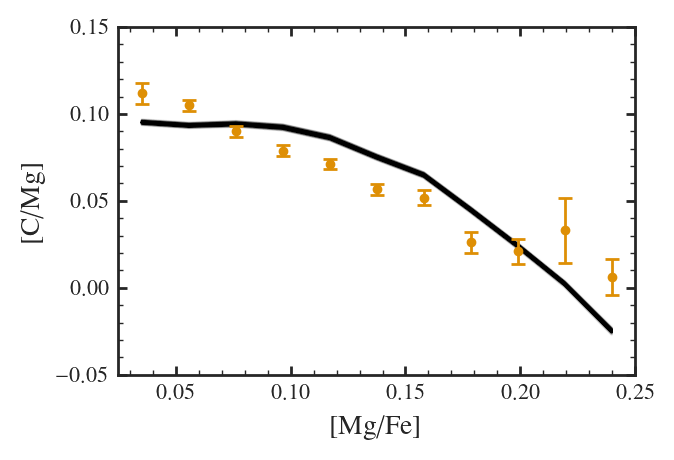

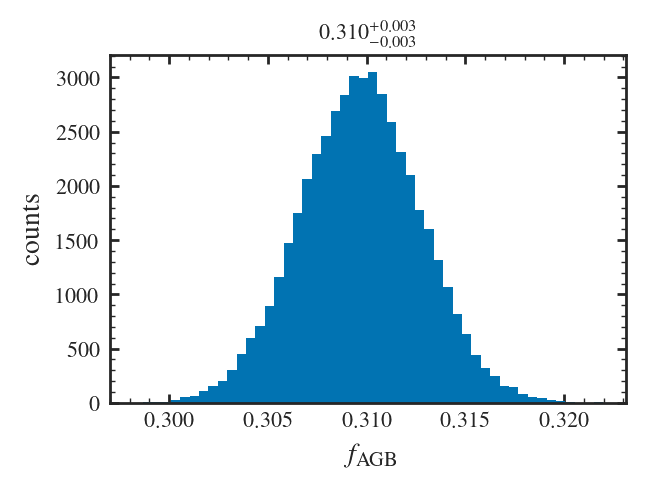

In [51]:
plot_all("fiducial_constrained", yagb_props["fruity"])

length of samples =  48000
{'alpha': {'name': 'perturbations/fruity', 'prior': 'Normal', 'prior_args': [1.0, 1.0]}, 'y0_cc': {'name': 'perturbations/constant', 'prior': 'Normal', 'prior_args': [0.79, 0.01]}, 'zeta_cc': {'name': 'perturbations/linear', 'prior': 'Normal', 'prior_args': [0.0, 2.0], 'y0': 0.001}}
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 3.453	-0.100	+0.101	-0.311	+0.311
y0_cc   	 0.835	-0.010	+0.010	-0.030	+0.030
zeta_cc 	 0.827	-0.059	+0.059	-0.178	+0.188


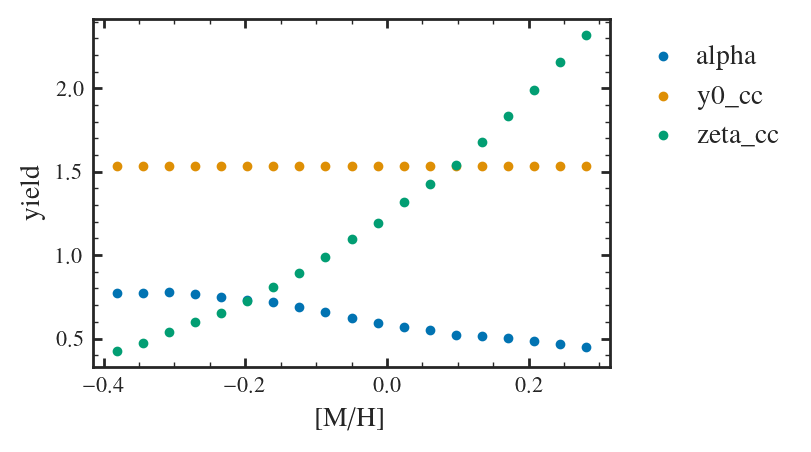

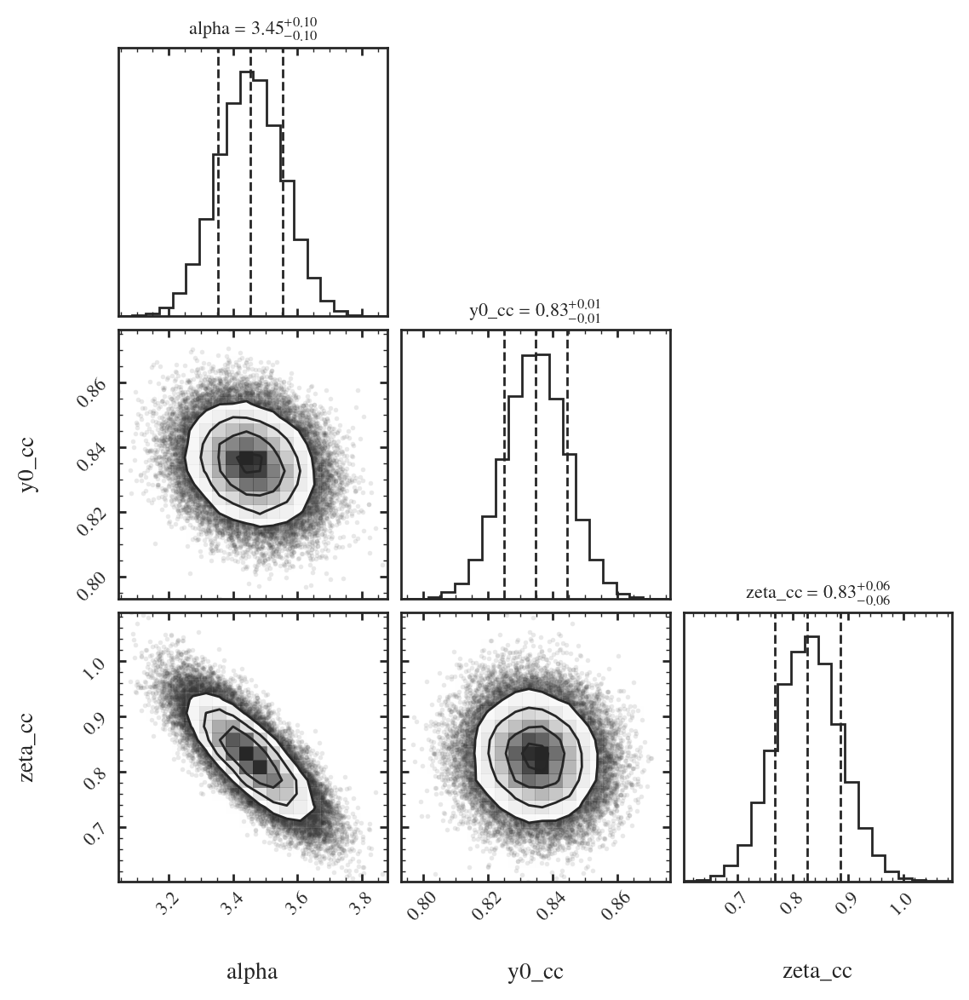

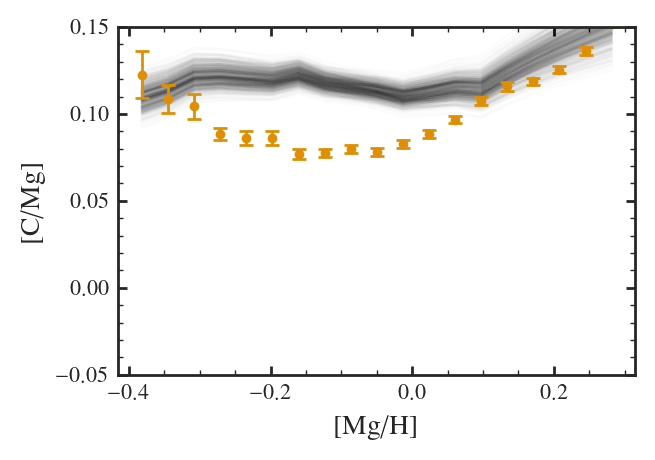

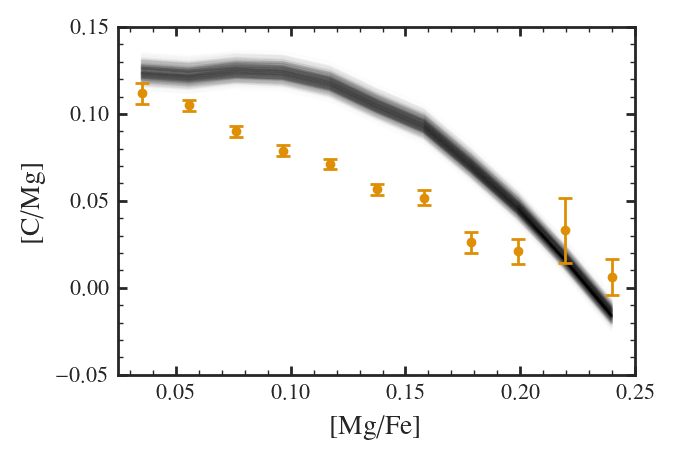

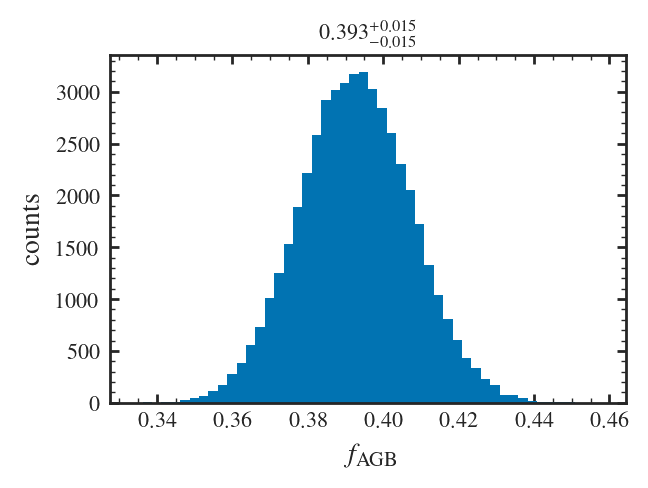

In [54]:
plot_all("fiducial_constrained_sigma0.05", yagb_props["fruity"])

In [77]:
np.log10(1 + 0.121 / 2.1)

np.float64(0.024329263814554712)

length of samples =  48000
{'alpha': {'name': 'perturbations/fruity', 'prior': 'Normal', 'prior_args': [1.0, 1.0]}, 'y0_cc': {'name': 'perturbations/constant', 'prior': 'Normal', 'prior_args': [2.0, 1.0]}, 'zeta_cc': {'name': 'perturbations/linear', 'prior': 'Normal', 'prior_args': [0.0, 2.0], 'y0': 0.001}}
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 2.302	-0.323	+0.308	-1.080	+0.980
y0_cc   	 1.185	-0.164	+0.174	-0.506	+0.586
zeta_cc 	 0.774	-0.074	+0.069	-0.254	+0.211
sigma_int	 0.121	-0.020	+0.024	-0.049	+0.096


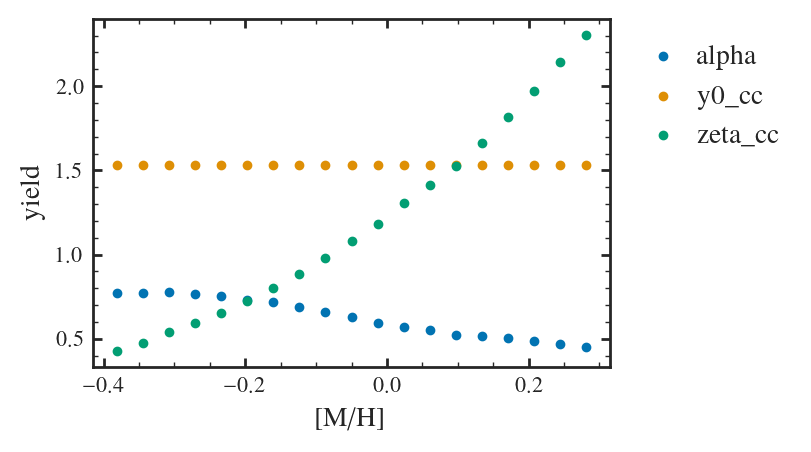

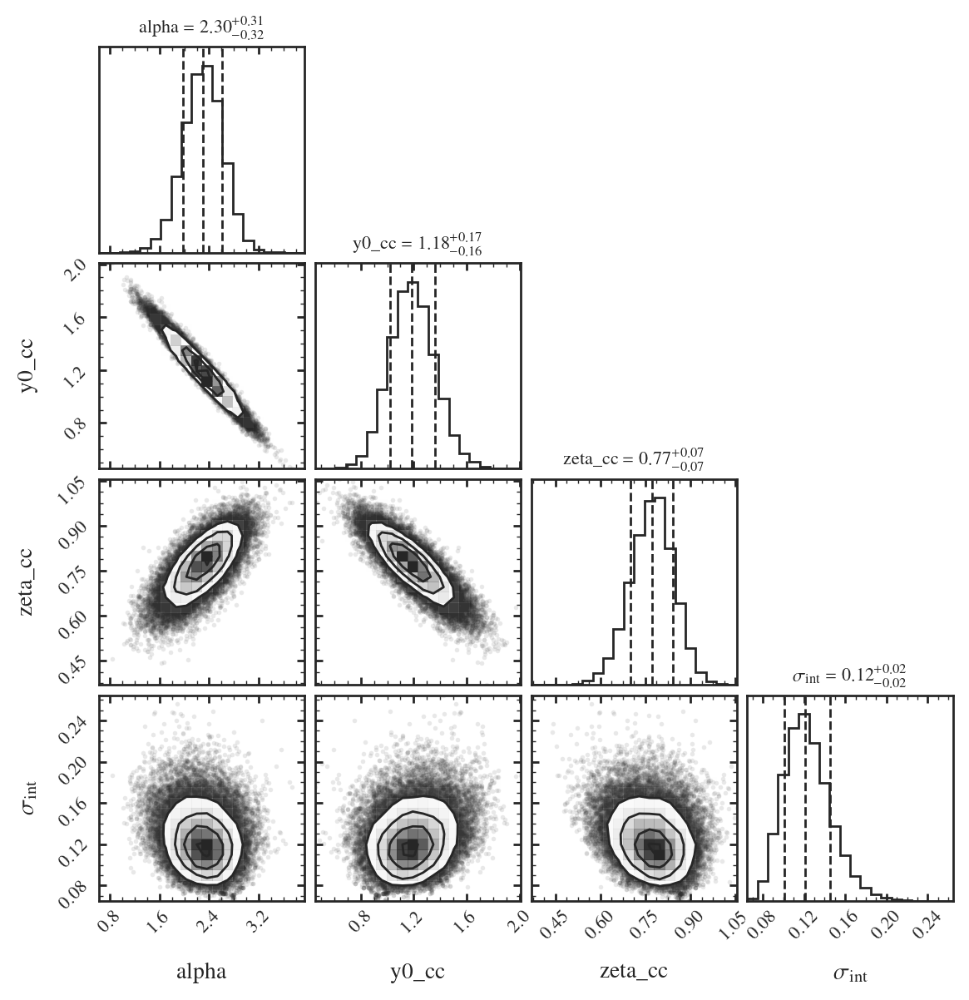

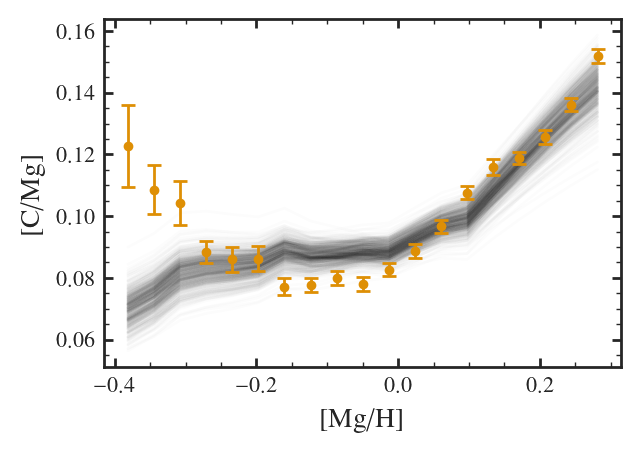

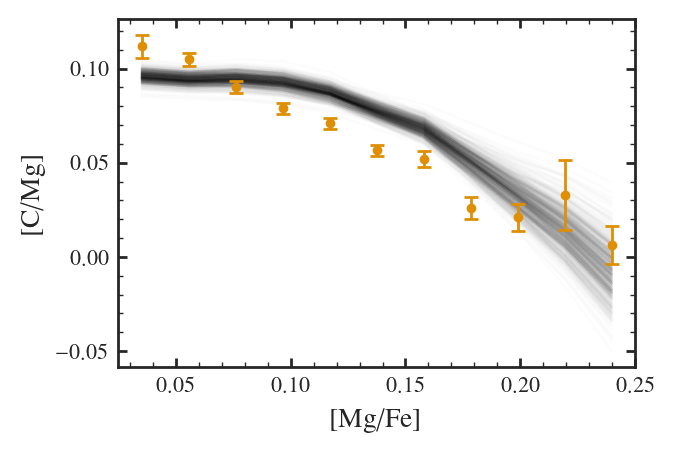

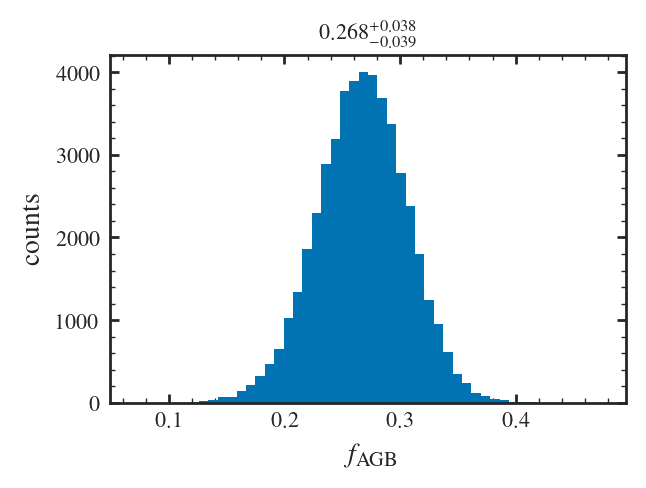

In [41]:
plot_all("fiducial_sigma", yagb_props["fruity"])

length of samples =  48000
{'alpha': {'name': 'perturbations/fruity', 'prior': 'Normal', 'prior_args': [1.0, 1.0]}, 'y0_cc': {'name': 'perturbations/constant', 'prior': 'Normal', 'prior_args': [2.0, 1.0]}, 'zeta_cc': {'name': 'perturbations/linear', 'prior': 'Normal', 'prior_args': [0.0, 2.0], 'y0': 0.001}}
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 2.262	-0.309	+0.292	-1.023	+0.940
y0_cc   	 1.206	-0.156	+0.164	-0.488	+0.560
zeta_cc 	 0.764	-0.073	+0.070	-0.265	+0.213
sigma_int	 0.028	-0.057	+0.007	-0.080	+0.026


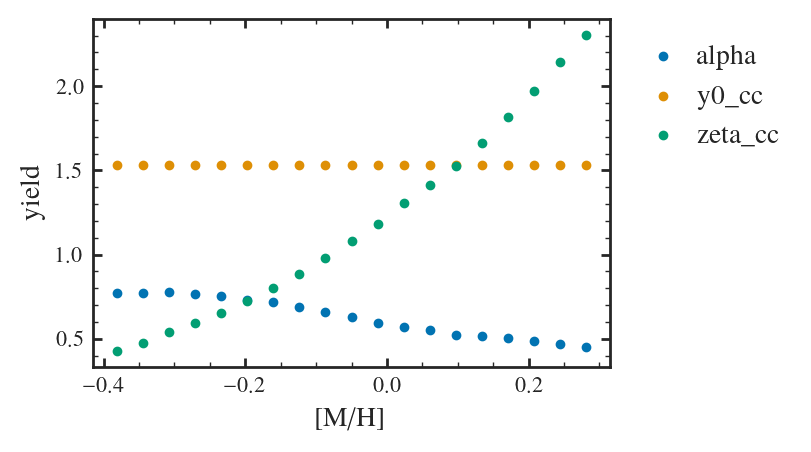

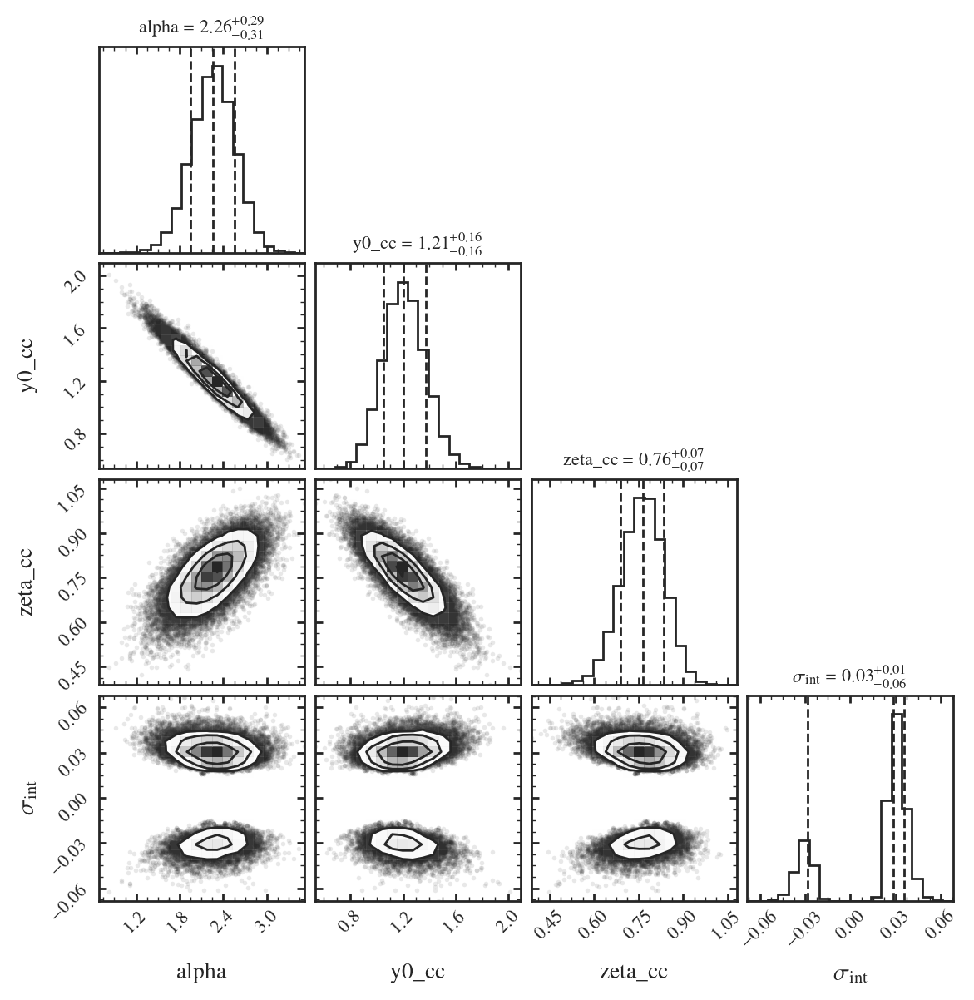

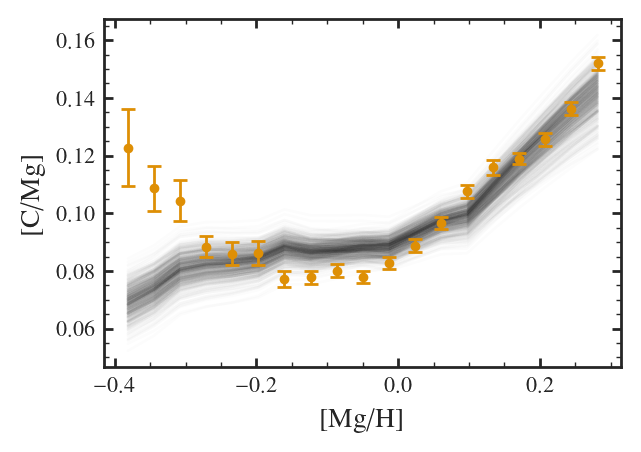

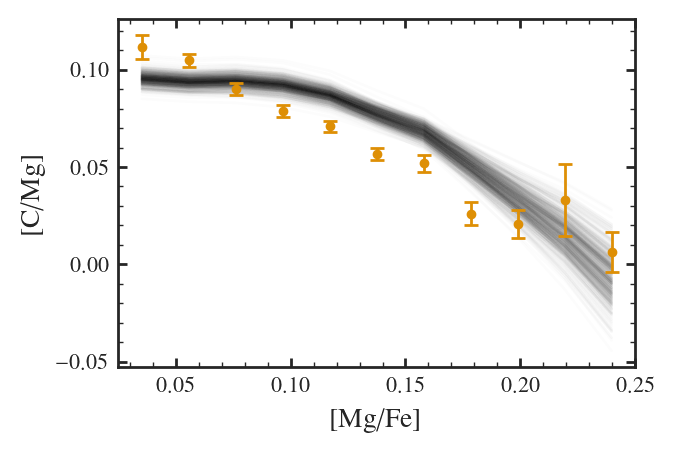

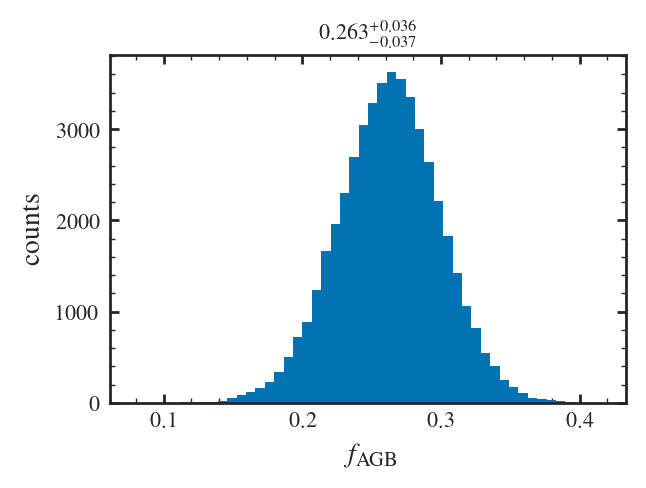

In [83]:
plot_all("fiducial_log_sigma", yagb_props["fruity"])

In [53]:
for f in [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.8]: 
    make_f_agb(alpha=2.64, y0=(1.83)*1e-3, f_new=f, study="fruity")

    print()

y0 = 1.830e-03
alpha = 0.000
f = 0.000

y0 = 1.565e-03
alpha = 0.852
f = 0.100

y0 = 1.300e-03
alpha = 1.705
f = 0.200

y0 = 1.035e-03
alpha = 2.557
f = 0.300

y0 = 7.696e-04
alpha = 3.410
f = 0.400

y0 = 5.045e-04
alpha = 4.262
f = 0.500

y0 = 2.394e-04
alpha = 5.115
f = 0.600

y0 = -2.908e-04
alpha = 6.819
f = 0.800



In [50]:
for f in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.8]: 
    make_f_agb(alpha=2.64, y0=(1.83+0.643)*1e-3, f_new=f, study="fruity")

    print()

y0 = 1.969e-03
alpha = 0.866
f = 0.100

y0 = 1.699e-03
alpha = 1.732
f = 0.200

y0 = 1.430e-03
alpha = 2.597
f = 0.300

y0 = 1.161e-03
alpha = 3.463
f = 0.400

y0 = 8.917e-04
alpha = 4.329
f = 0.500

y0 = 6.224e-04
alpha = 5.195
f = 0.600

y0 = 8.385e-05
alpha = 6.927
f = 0.800



length of samples =  48000
{'alpha': {'name': 'perturbations/fruity', 'prior': 'Normal', 'prior_args': [1.0, 1.0]}, 'y0_cc': {'name': 'perturbations/constant', 'prior': 'Normal', 'prior_args': [2.0, 1.0]}, 'zeta_cc': {'name': 'perturbations/linear', 'prior': 'Normal', 'prior_args': [0.0, 2.0], 'y0': 0.001}}
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 1.462	-0.043	+0.043	-0.130	+0.133
y0_cc   	 1.595	-0.021	+0.021	-0.066	+0.066
zeta_cc 	 0.643	-0.011	+0.011	-0.032	+0.033


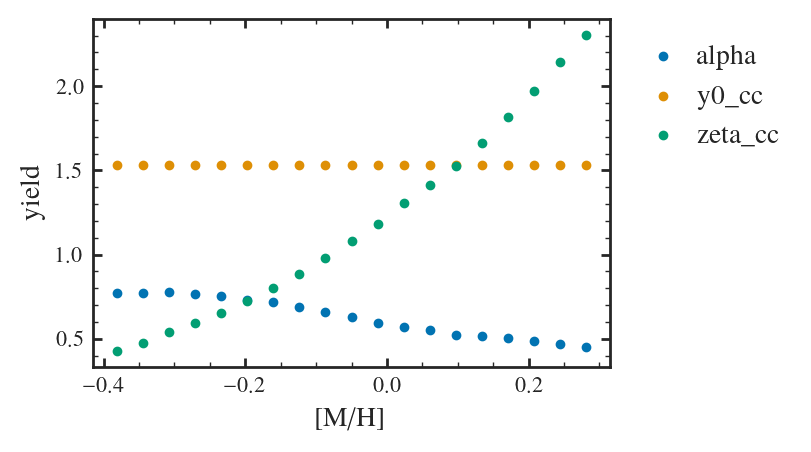

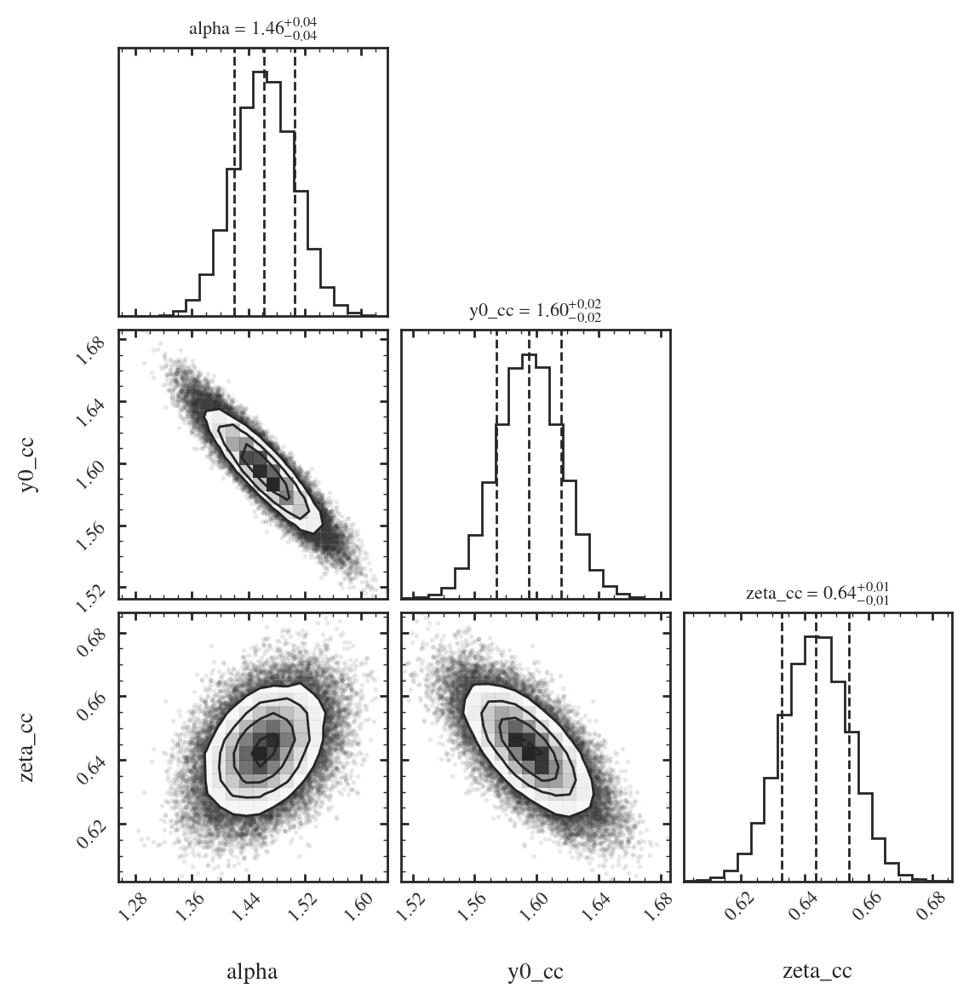

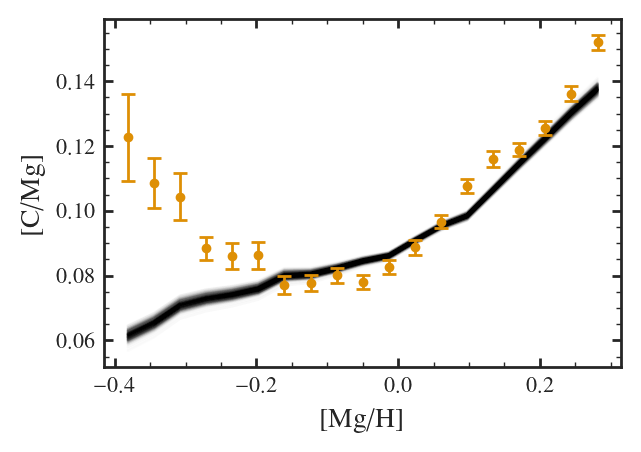

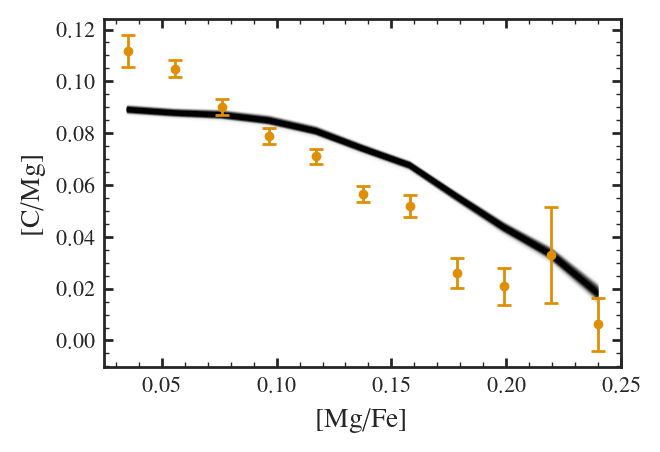

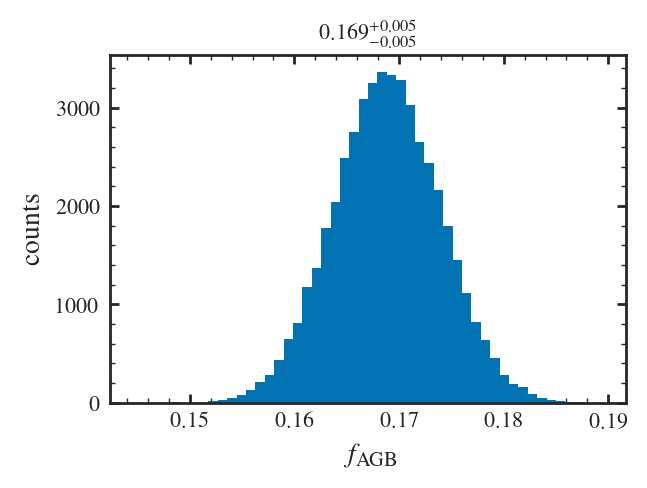

In [40]:
plot_all("fiducial", yagb_props["fruity"], directory="mcmc_models_2d")

length of samples =  48000
{'alpha': {'name': 'perturbations/fruity', 'prior': 'Normal', 'prior_args': [1.0, 1.0]}, 'y0_cc': {'name': 'perturbations/constant', 'prior': 'Normal', 'prior_args': [2.0, 1.0]}, 'zeta_cc': {'name': 'perturbations/linear', 'prior': 'Normal', 'prior_args': [0.0, 2.0], 'y0': 0.001}}
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 1.443	-0.041	+0.041	-0.124	+0.125
y0_cc   	 1.617	-0.020	+0.020	-0.060	+0.061
zeta_cc 	 0.633	-0.010	+0.010	-0.031	+0.031


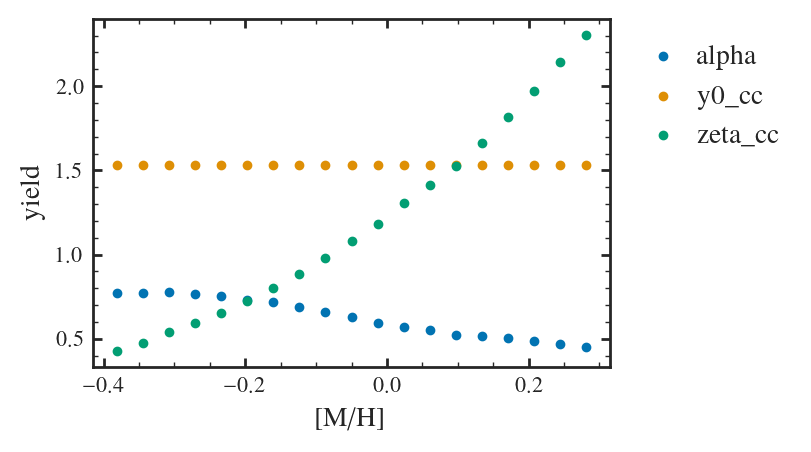

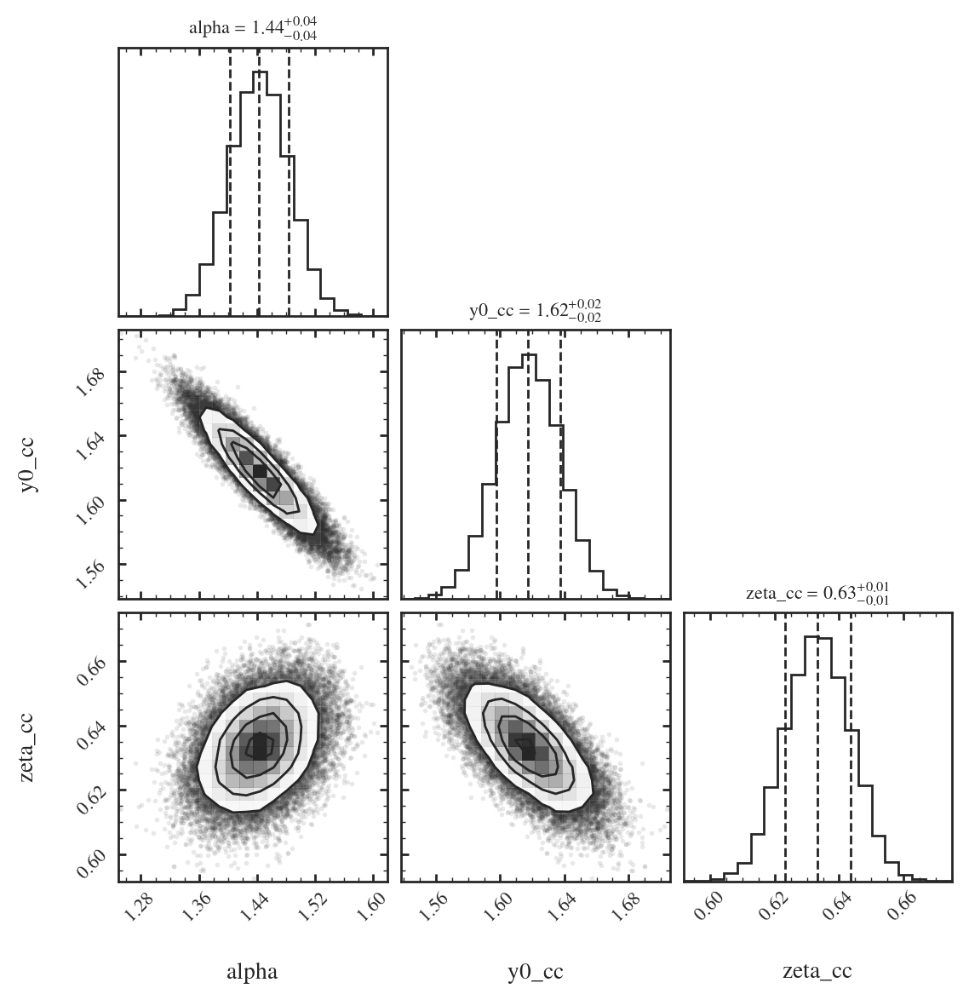

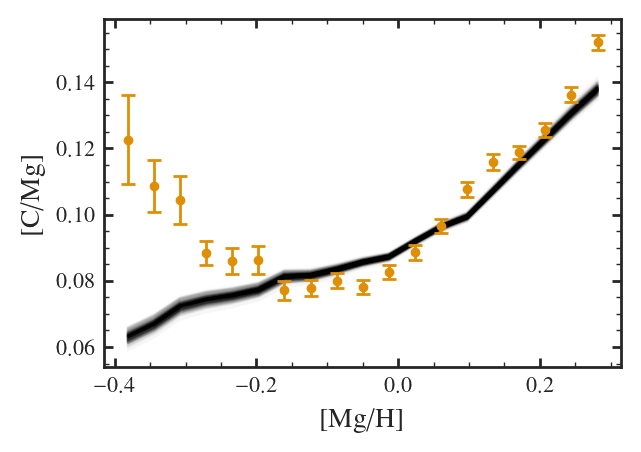

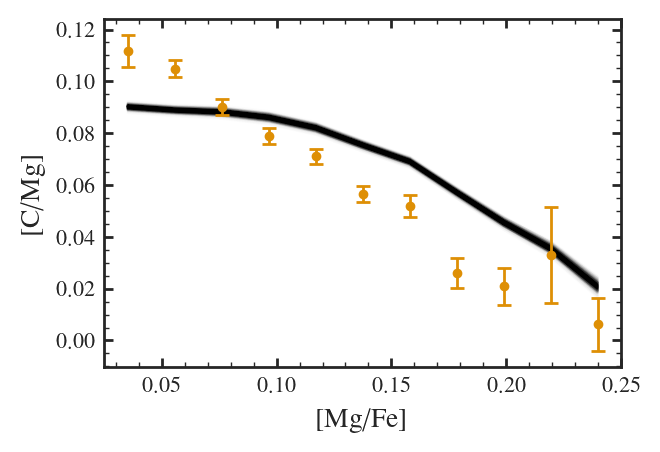

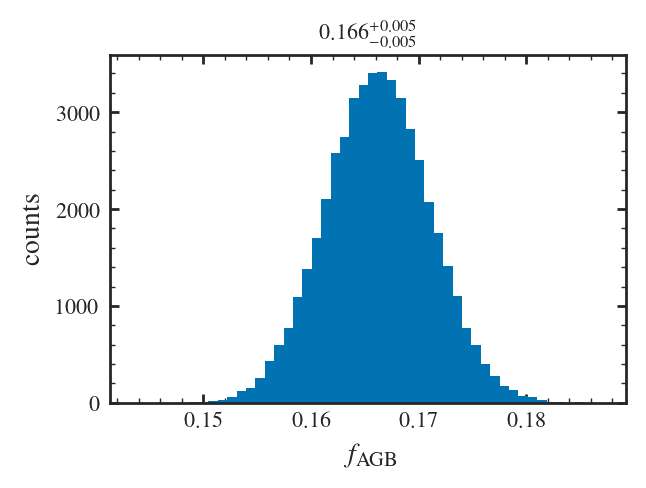

In [81]:
plot_all("fiducial_log", yagb_props["fruity"], directory="mcmc_models_2d")

length of samples =  48000
{'alpha': {'name': 'perturbations/fruity', 'prior': 'Normal', 'prior_args': [1.0, 1.0]}, 'y0_cc': {'name': 'perturbations/constant', 'prior': 'Normal', 'prior_args': [2.0, 1.0]}, 'zeta_cc': {'name': 'perturbations/linear', 'prior': 'Normal', 'prior_args': [0.0, 2.0], 'y0': 0.001}}
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 1.569	-0.106	+0.106	-0.324	+0.339
y0_cc   	 1.717	-0.045	+0.046	-0.142	+0.143
zeta_cc 	 0.463	-0.040	+0.039	-0.129	+0.121
sigma_int	 0.185	-0.015	+0.017	-0.042	+0.059


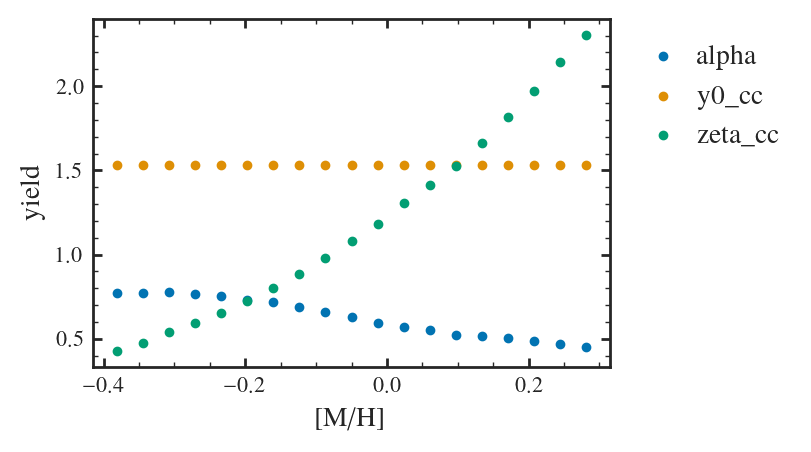

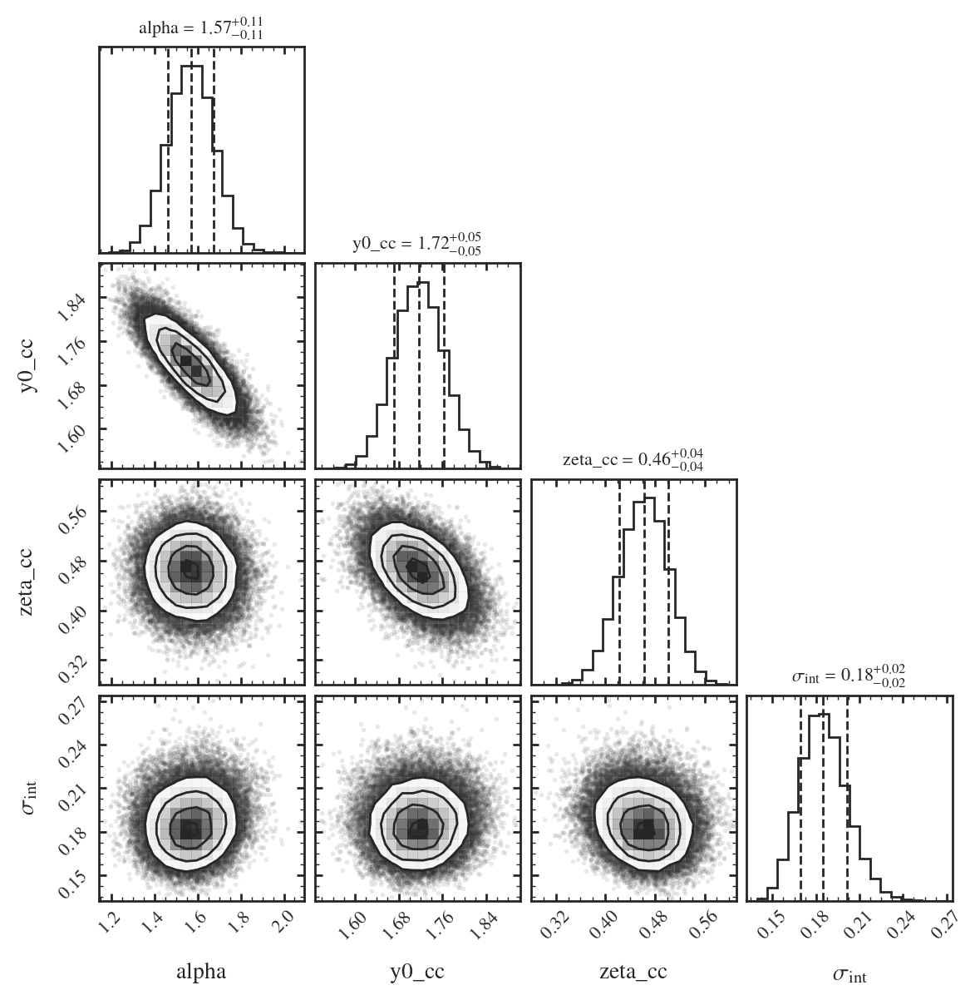

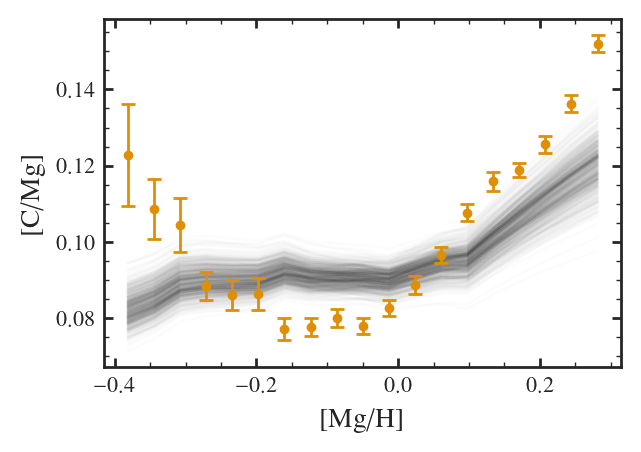

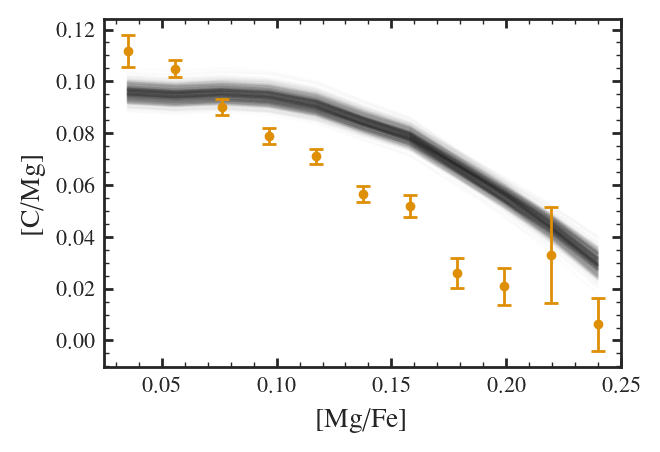

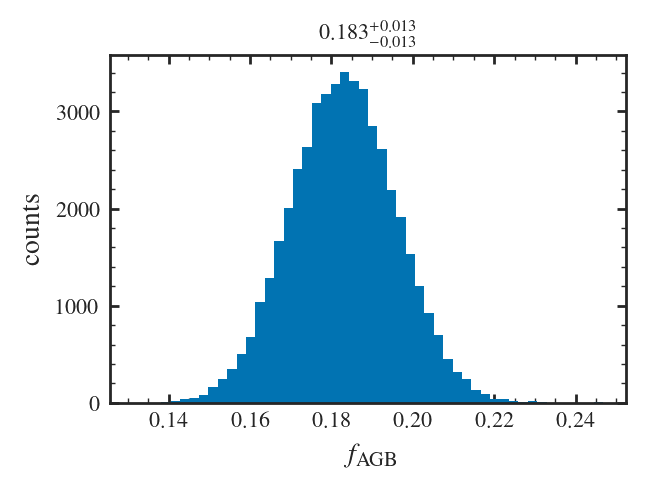

In [43]:
plot_all("fiducial_sigma", yagb_props["fruity"], directory="mcmc_models_2d")

In [52]:
0.704 / np.log(10)

np.float64(0.30574331525988924)

In [20]:
0.824e-3 

0.0018973301166270939

In [75]:
np.log(10)

np.float64(2.302585092994046)

In [74]:
1/surp.Z_SUN / surp.yield_models.zeta_to_slope(1)

2.302585092994046

In [69]:
surp.yield_models.zeta_to_slope(0.002) * surp.Z_SUN

0.0008685889638065036

In [36]:
0.989 + 0.839

1.8279999999999998

length of samples =  48000
{'alpha': {'name': 'perturbations/fruity', 'prior': 'Normal', 'prior_args': [1.0, 1.0]}, 'y0_cc': {'name': 'perturbations/constant', 'prior': 'Normal', 'prior_args': [0.79, 0.01]}, 'zeta_cc': {'name': 'perturbations/linear', 'prior': 'Normal', 'prior_args': [0.0, 2.0], 'y0': 0.001}}
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 2.714	-0.026	+0.026	-0.080	+0.080
y0_cc   	 0.919	-0.009	+0.009	-0.028	+0.029
zeta_cc 	 0.904	-0.008	+0.008	-0.026	+0.026


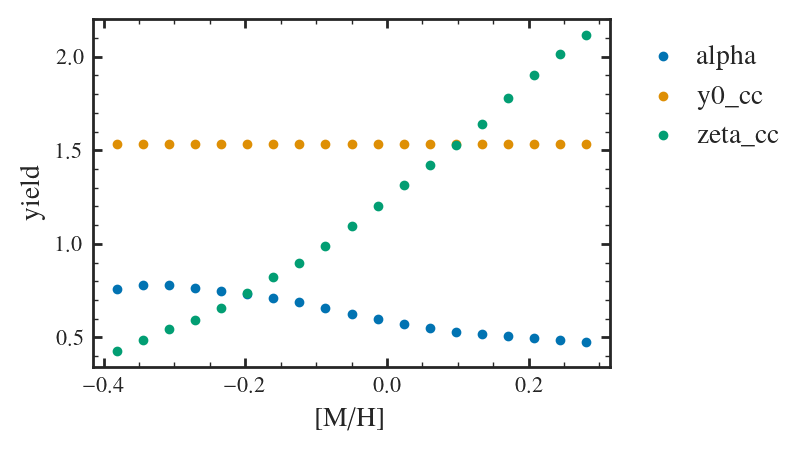

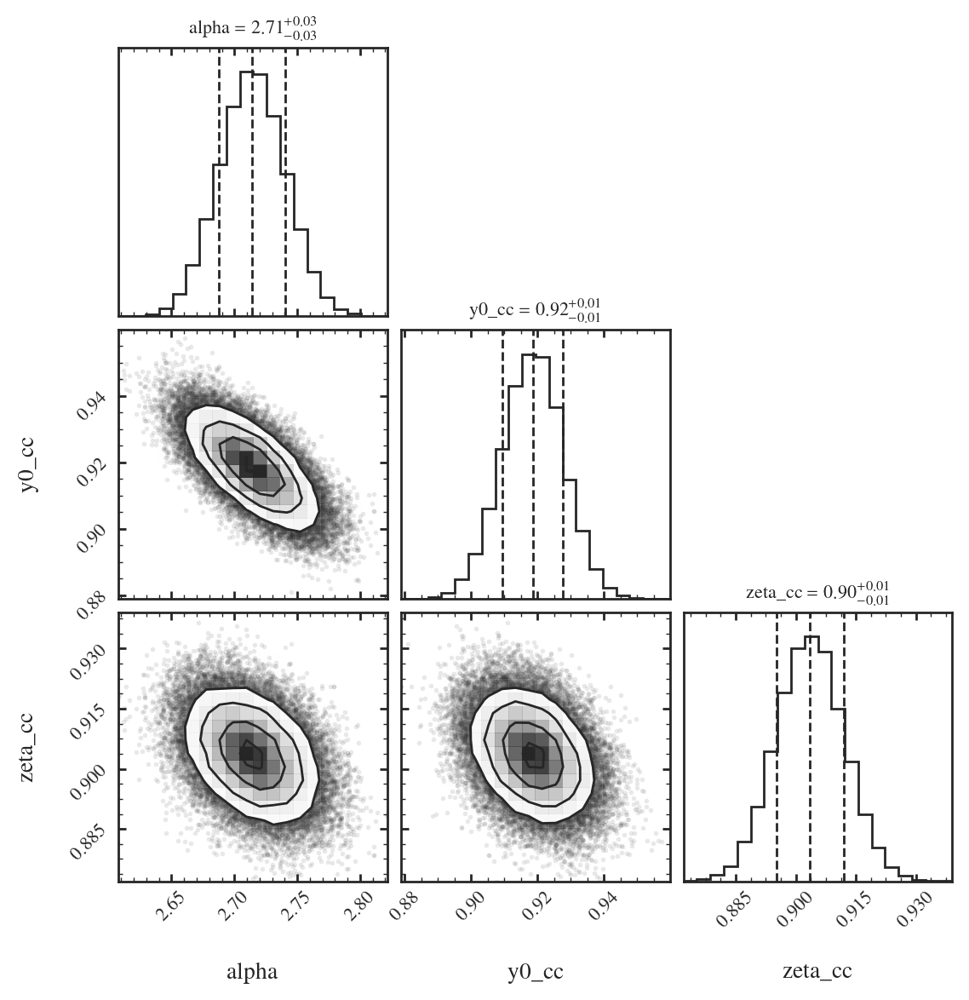

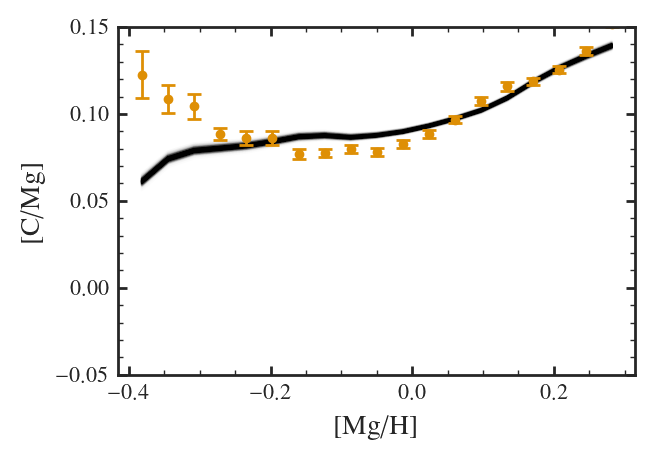

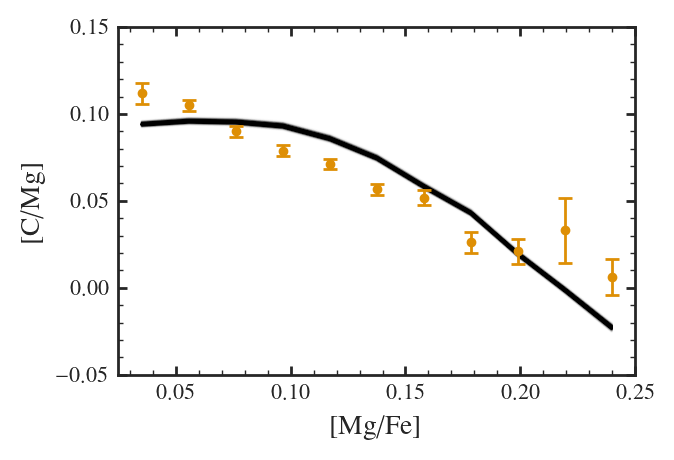

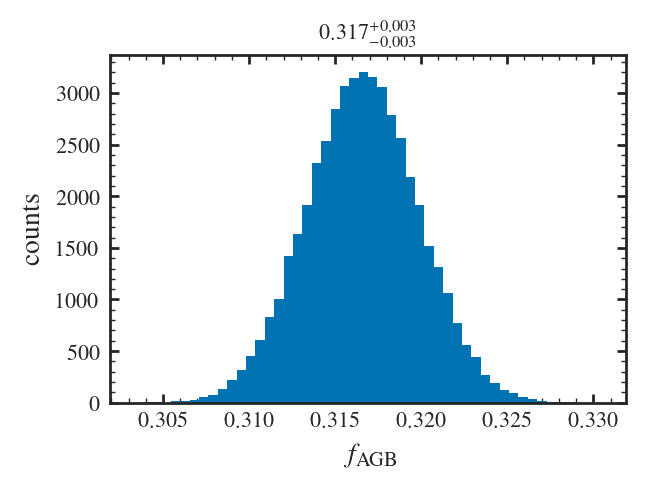

In [28]:
plot_all("fiducial_constrained", yagb_props["fruity"], directory="mcmc_models_2d")

In [13]:
surp.gce_math.abund_ratio_to_brak(0.95, "c", "mg")

np.float64(-0.5463836966294551)

# Tests

## Recovery

length of samples =  48000
{'datafile': '../fiducial/run/stars.csv', 'alpha': {'name': 'perturbations/fruity', 'prior': 'Normal', 'prior_args': [1.0, 1.0]}, 'y0_cc': {'name': 'perturbations/constant', 'prior': 'Normal', 'prior_args': [2.0, 1.0]}, 'zeta_cc': {'name': 'perturbations/linear', 'prior': 'Normal', 'prior_args': [0.0, 2.0], 'y0': 0.001}}
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 2.496	-0.031	+0.030	-0.104	+0.094
y0_cc   	 1.072	-0.014	+0.014	-0.042	+0.044
zeta_cc 	 0.817	-0.007	+0.007	-0.023	+0.022


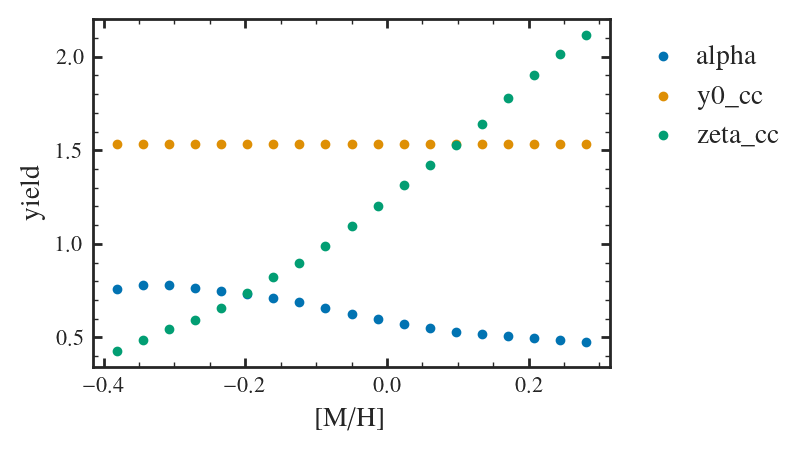

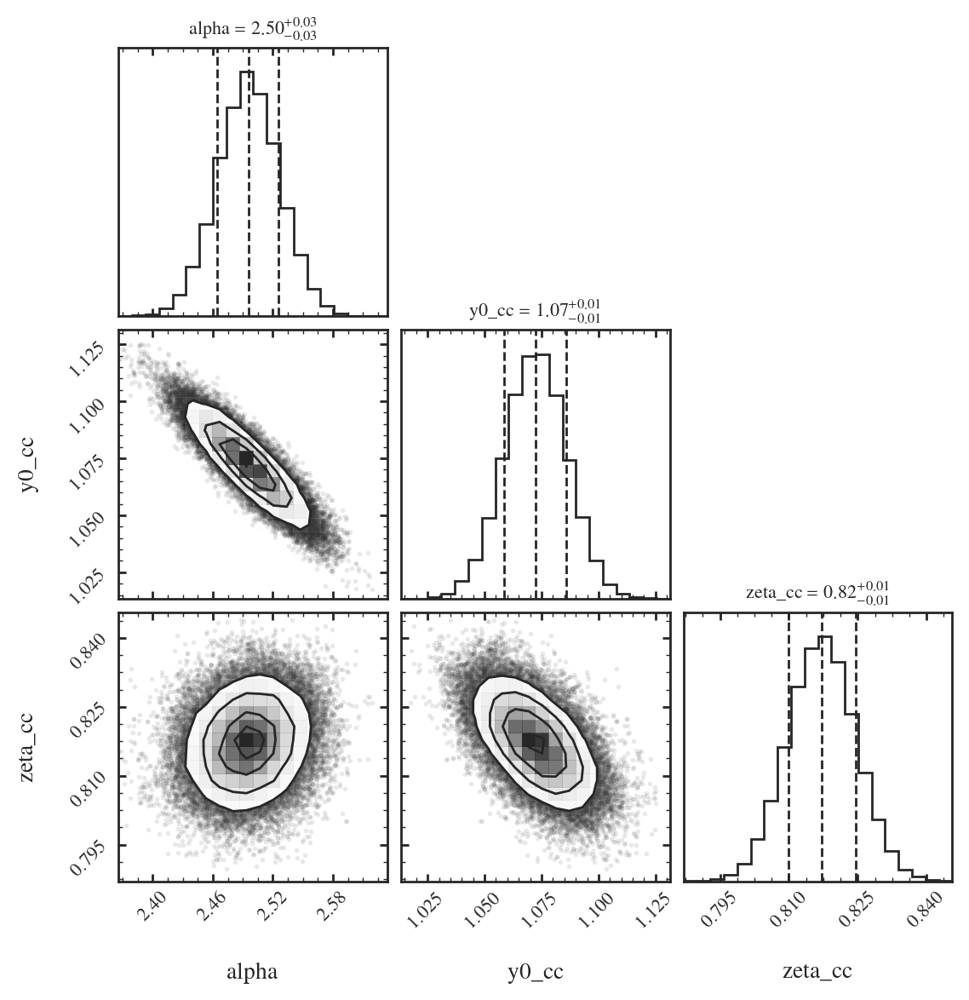

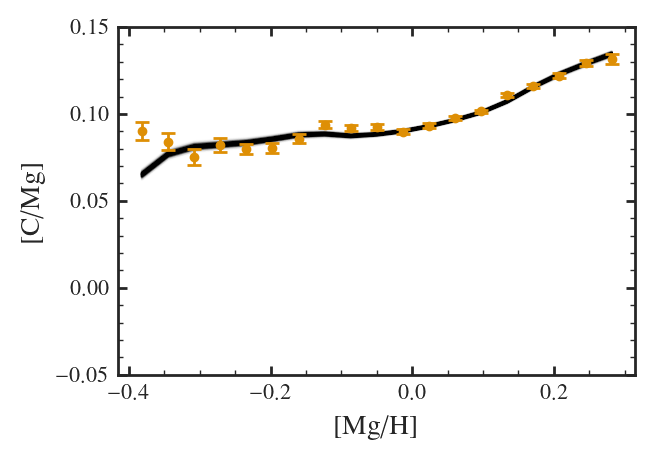

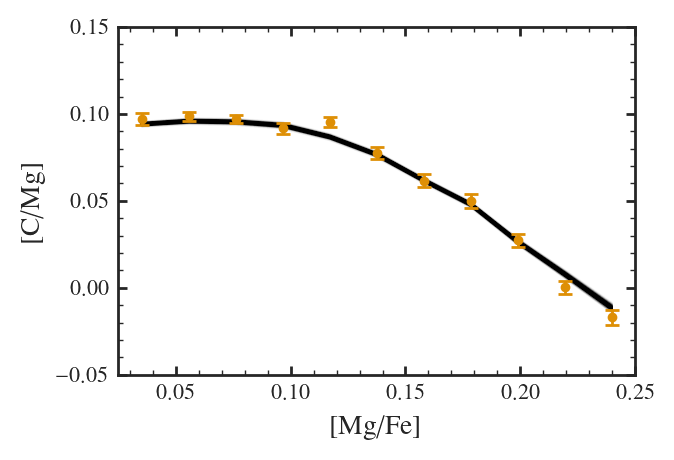

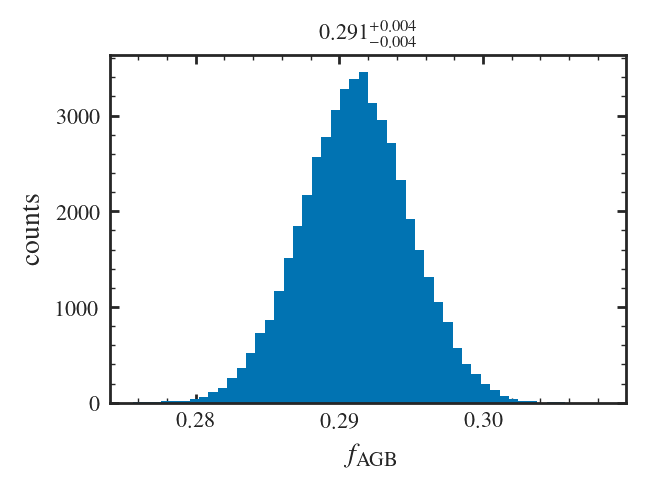

In [26]:
plot_all("fiducial_recovery", yagb_props["fruity"], directory="mcmc_models_2d")

length of samples =  48000
{'datafile': '../fiducial/run/stars.csv', 'alpha': {'name': 'perturbations/fruity', 'prior': 'Normal', 'prior_args': [1.0, 1.0]}, 'y0_cc': {'name': 'perturbations/constant', 'prior': 'Normal', 'prior_args': [2.0, 1.0]}, 'zeta_cc': {'name': 'perturbations/linear', 'prior': 'Normal', 'prior_args': [0.0, 2.0], 'y0': 0.001}}
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 2.481	-0.076	+0.076	-0.236	+0.236
y0_cc   	 1.072	-0.028	+0.028	-0.089	+0.089
zeta_cc 	 0.820	-0.035	+0.035	-0.110	+0.109


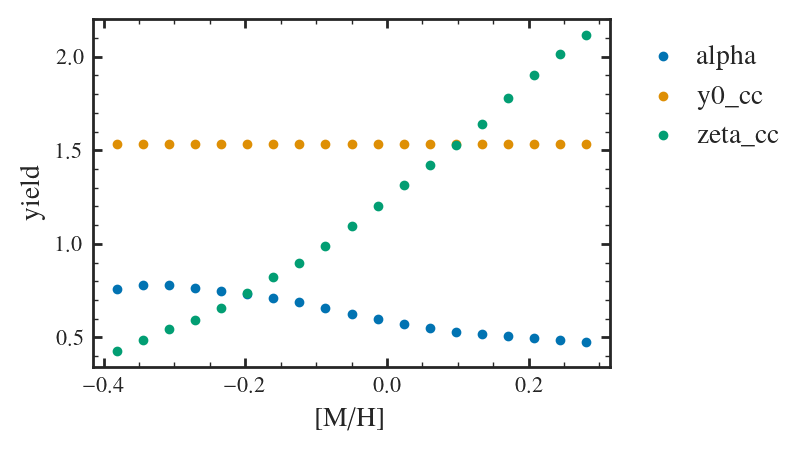

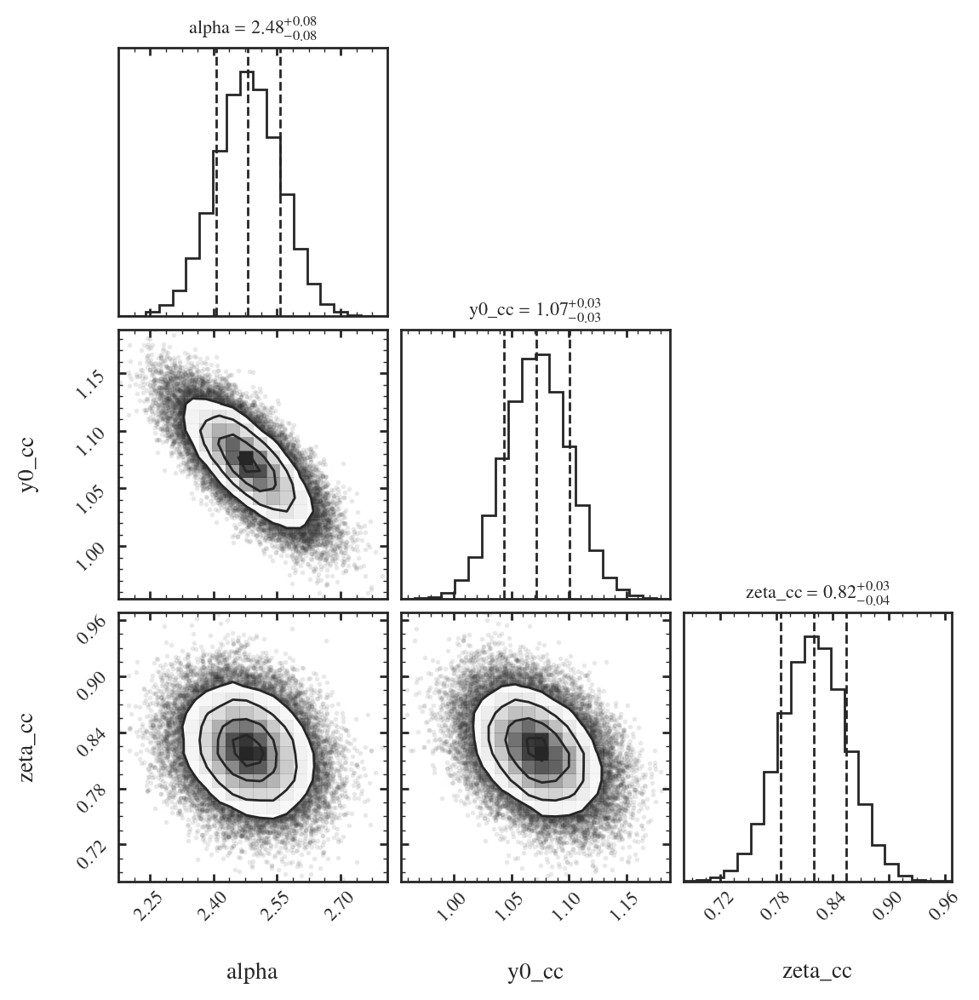

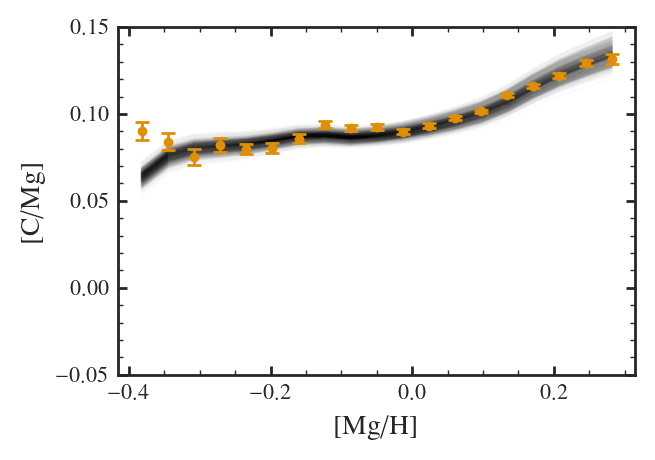

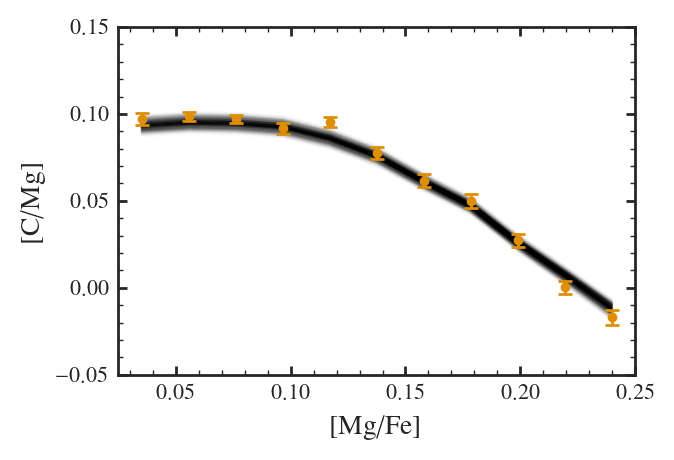

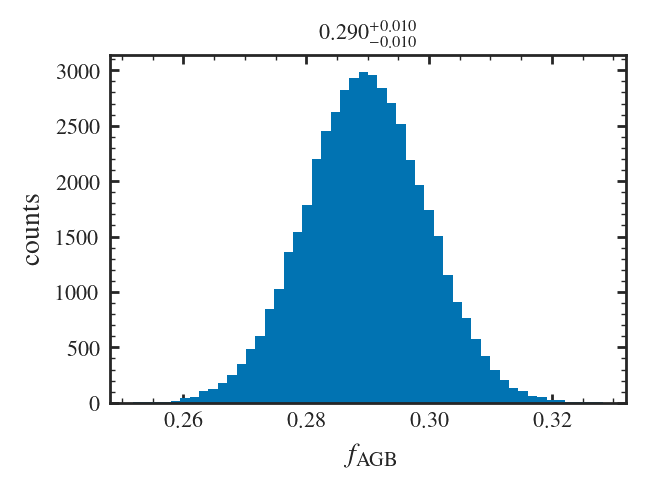

In [27]:
plot_all("fiducial_recovery_sigma0.02", yagb_props["fruity"], directory="mcmc_models_2d")

## Extra parameters

length of samples =  48000
{'alpha': {'name': 'perturbations/fruity', 'prior': 'Normal', 'prior_args': [1.0, 1.0]}, 'y0_cc': {'name': 'perturbations/constant', 'prior': 'Normal', 'prior_args': [2.0, 1.0]}, 'zeta_cc': {'name': 'perturbations/linear', 'prior': 'Normal', 'prior_args': [0.0, 2.0], 'y0': 0.001}}
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 1.434	-0.039	+0.040	-0.122	+0.121
y0_cc   	 1.623	-0.019	+0.019	-0.061	+0.059
zeta_cc 	 0.630	-0.010	+0.010	-0.030	+0.032


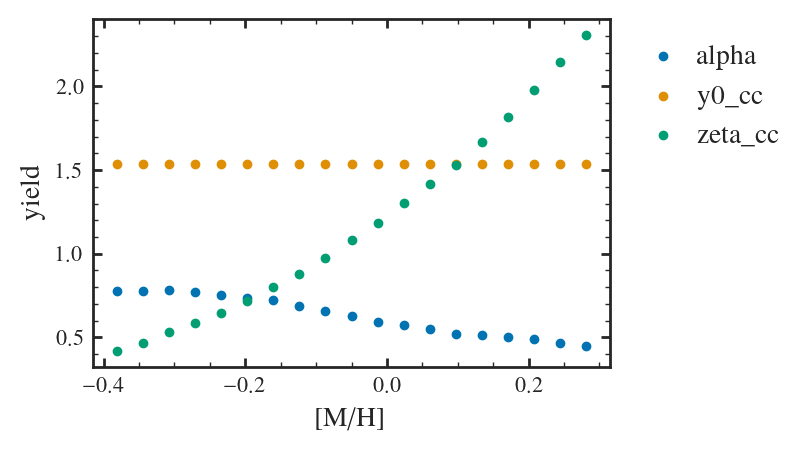

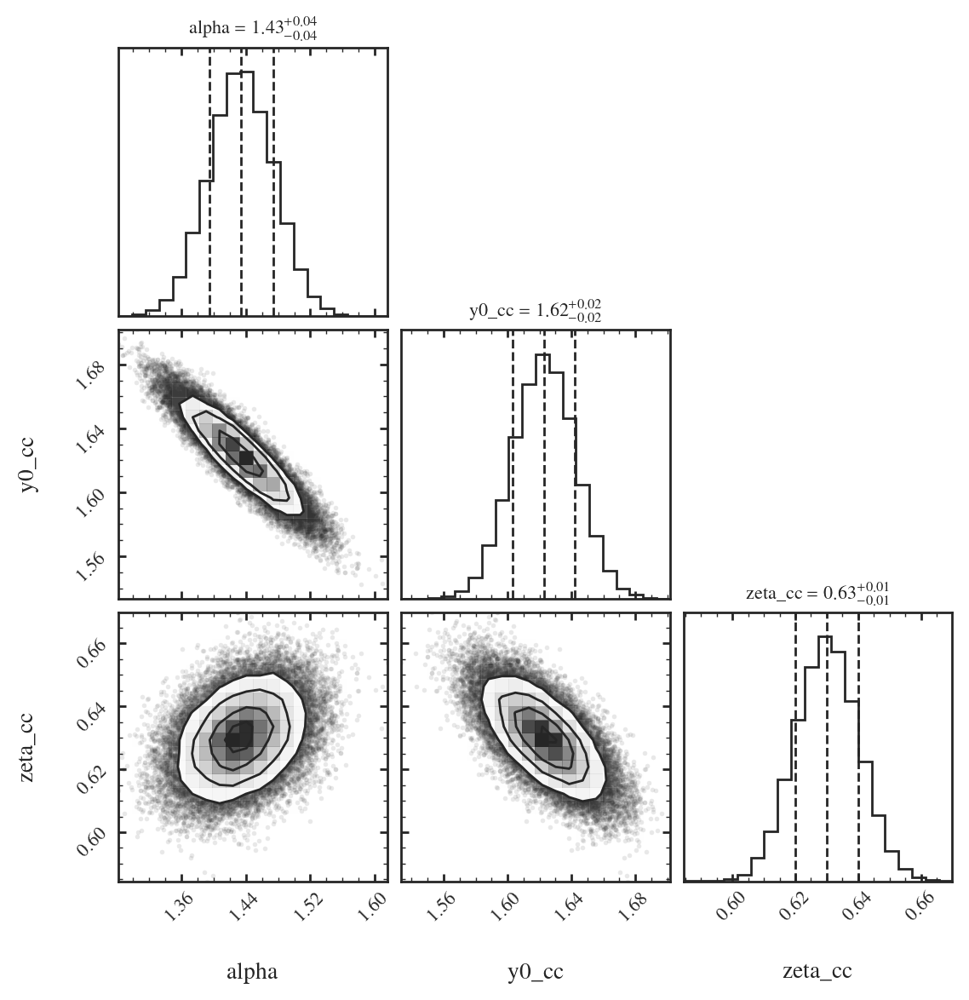

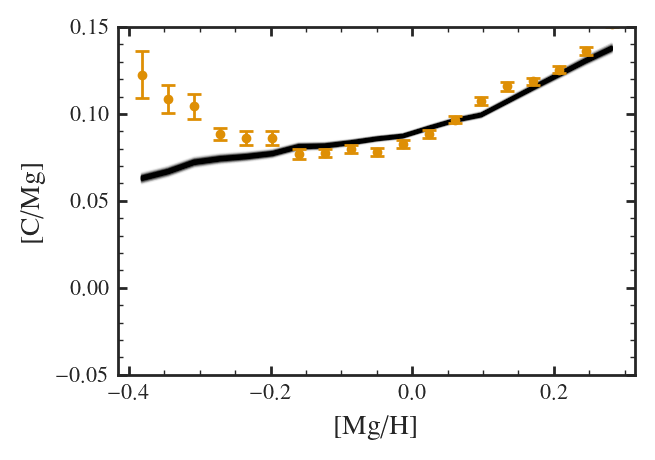

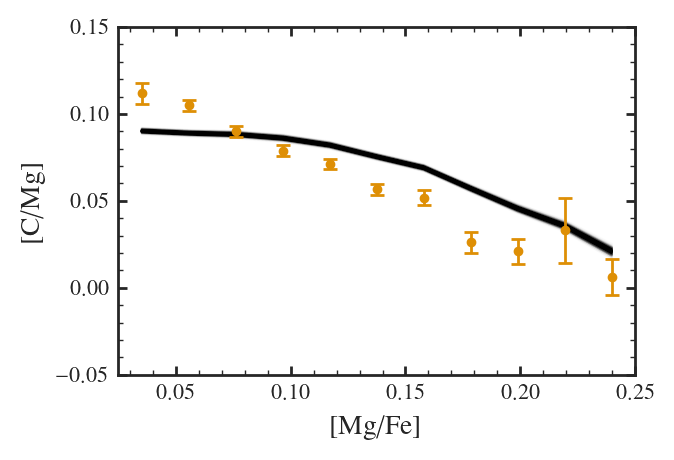

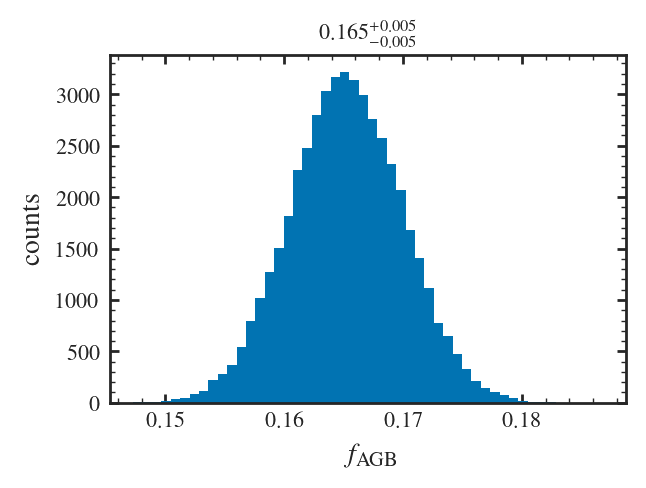

In [21]:
plot_all("fiducial", yagb_props["fruity"], directory="mcmc_models_2d")

length of samples =  48000
{'mg_h_bins': [-0.5, -0.42, -0.34, -0.26, -0.18, -0.1, -0.02, 0.06, 0.14, 0.22, 0.3, 0.38, 0.46], 'mg_fe_bins': [-0.1, -0.02, 0.06, 0.14, 0.22, 0.3, 0.38], 'alpha': {'name': 'perturbations/fruity', 'prior': 'Normal', 'prior_args': [1.0, 1.0]}, 'y0_cc': {'name': 'perturbations/constant', 'prior': 'Normal', 'prior_args': [2.0, 1.0]}, 'zeta_cc': {'name': 'perturbations/linear', 'prior': 'Normal', 'prior_args': [0.0, 2.0], 'y0': 0.001}}
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 1.472	-0.044	+0.044	-0.135	+0.131
y0_cc   	 1.570	-0.020	+0.020	-0.062	+0.062
zeta_cc 	 0.684	-0.010	+0.010	-0.031	+0.032


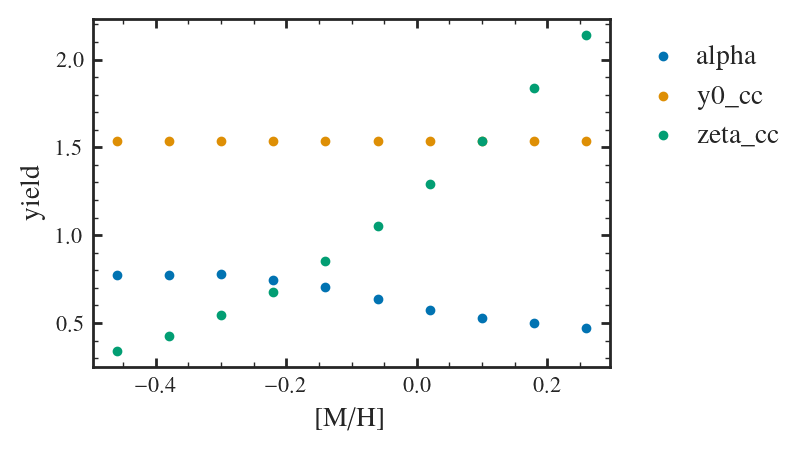

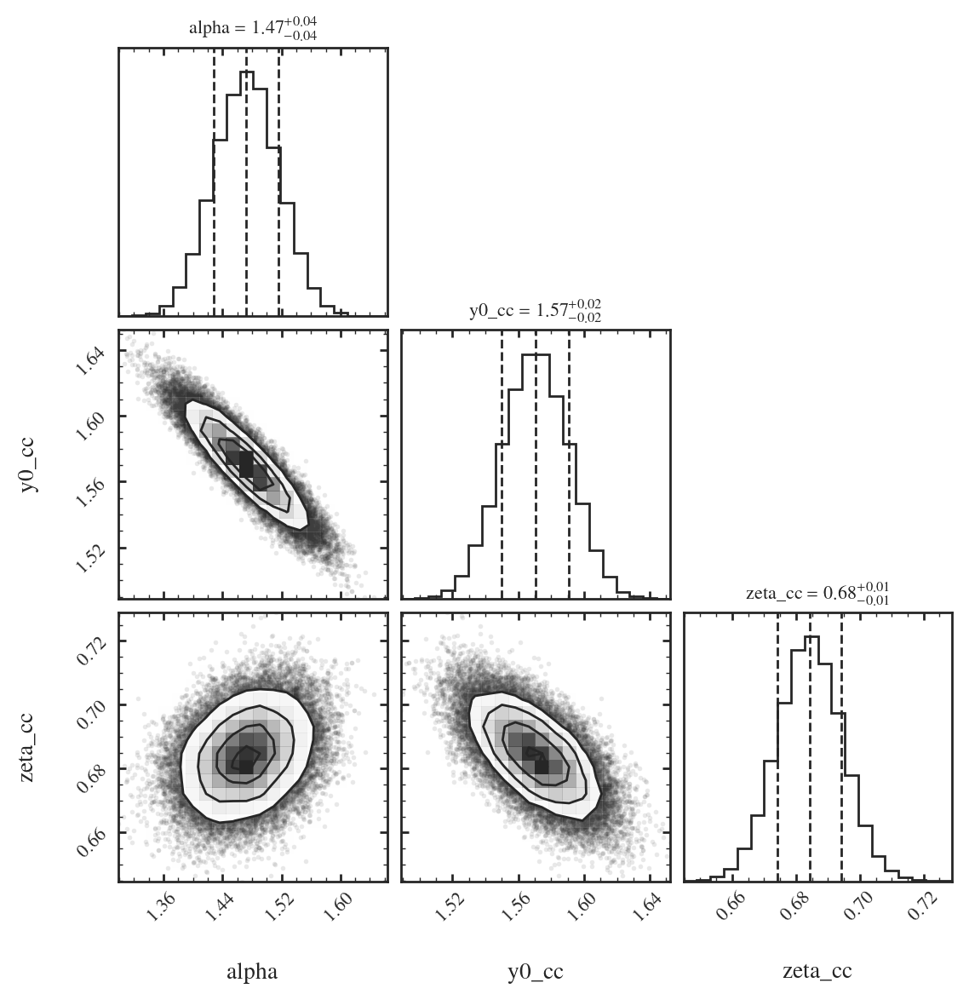

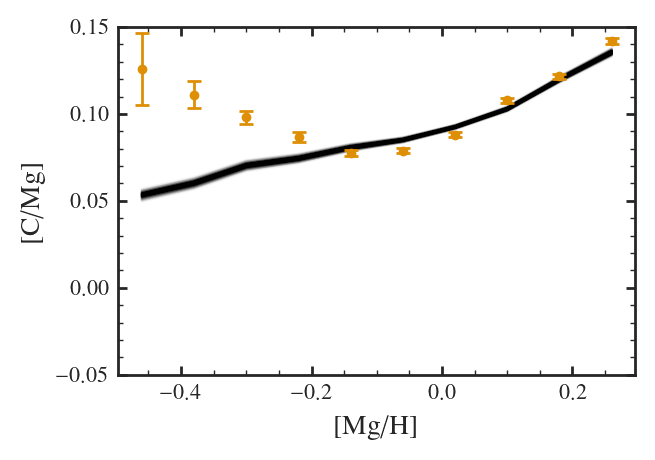

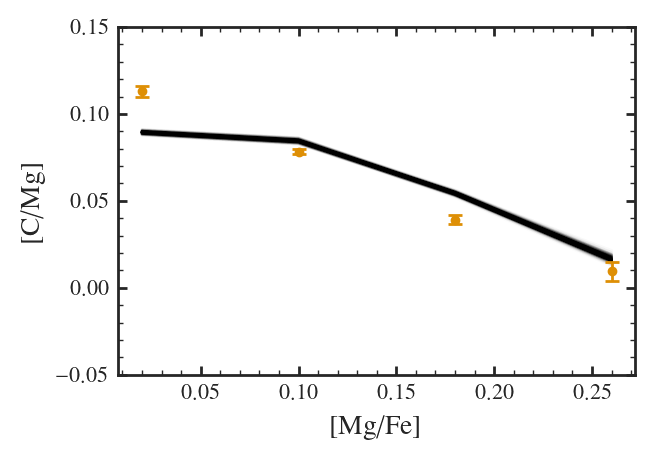

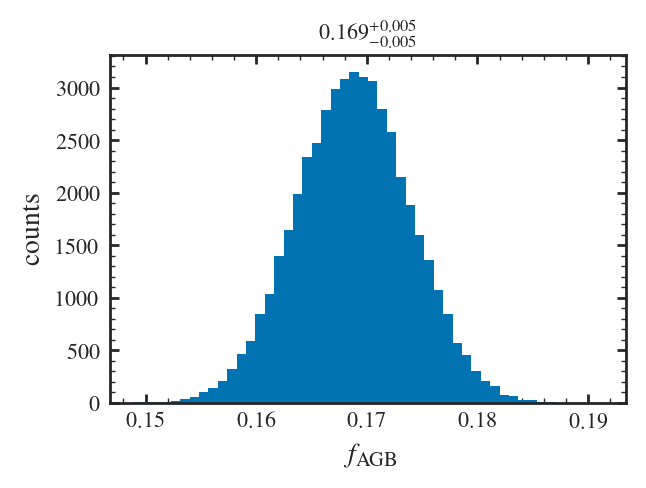

In [20]:
plot_all("fiducial_0.5bins", yagb_props["fruity"], directory="mcmc_models_2d")

In [22]:
plot_all("fiducial_log", yagb_props["fruity"], directory="mcmc_models_2d")

FileNotFoundError: [Errno 2] No such file or directory: '../models/mcmc_models_2d/fiducial_log//params.toml'